In [9]:
import random
import numpy as np
import statsmodels.api as sm
from sklearn.linear_model import LinearRegression, Lasso, LassoCV, Ridge, RidgeCV, ElasticNet, ElasticNetCV
from sklearn.model_selection import train_test_split, KFold, cross_val_score
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
import scipy.stats as stats
pd.set_option('display.max_columns', None)

import seaborn as sns
import pandas as pd
import matplotlib.pyplot as plt
%config InlineBackend.figure_format = 'svg'
%matplotlib inline

In [2]:
df=pd.read_csv('monitor_cleaned_final.csv')
df.sample(3)
df.drop(columns=['product_link','product_name'],inplace=True) #Drop columns not using for modeling

In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 502 entries, 0 to 501
Data columns (total 25 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   brand                       502 non-null    object 
 1   Price                       502 non-null    float64
 2   rating                      502 non-null    float64
 3   review_count                502 non-null    float64
 4   Refresh_Rate                502 non-null    float64
 5   Contrast_Ratio              502 non-null    float64
 6   Response_Time               502 non-null    float64
 7   Synchronization_Technology  502 non-null    object 
 8   Panel_Type                  502 non-null    object 
 9   Curved_Screen               502 non-null    object 
 10  Brightness                  502 non-null    float64
 11  Screen_Size                 502 non-null    float64
 12  HDR                         502 non-null    object 
 13  Smart_Display               502 non

### Look at the distribution of the price

/Users/Layla/opt/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:xlabel='Price', ylabel='Density'>

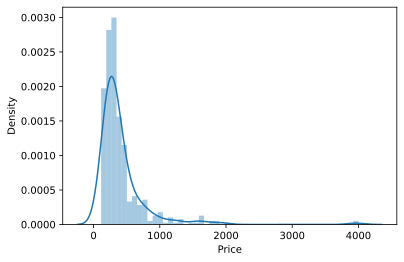

In [4]:
sns.distplot(df['Price'])    # right skewed

/Users/Layla/opt/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


NameError: name 'df_x' is not defined

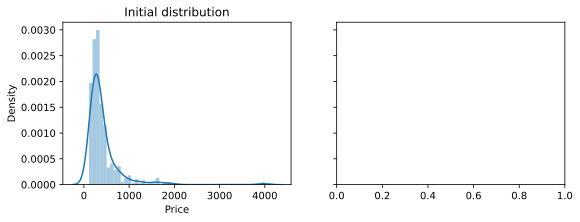

In [5]:
fig, axes = plt.subplots(1, 2,sharey=True,figsize=(9,3))

sns.distplot(df['Price'],ax=axes[0])
axes[0].set_title('Initial distribution')
sns.distplot(df_x['Price'],ax=axes[1])
axes[1].set_title('Dropped significant outliners')
plt.savefig('Price Distribution',bbox_inches="tight",dpi=300)

In [6]:
df_outlier=df[df['Price']>1800]

In [10]:
df_outlier

,brand,Price,rating,review_count,Refresh_Rate,Contrast_Ratio,Response_Time,Synchronization_Technology,Panel_Type,Curved_Screen,Brightness,Screen_Size,HDR,Smart_Display,Touch_Screen,Quantum_Dot_Technology,Headphone_Jack,Voice_Assistant,Wall_Mountable,Anti_Glare,Speaker,Webcam,Weight,Resolution,Total_Pixels
25,Samsung,1899.99,4.0,88.0,240.0,1000000.0,1.0,FreeSync&G-SYNC,VA,Yes,420.0,49.0,Yes,No,No,Yes,Yes,No,Yes,No,No,No,32.0,5120 x 1440,7372800
295,LG,3999.99,4.0,3.0,60.0,1000000.0,1.0,Not Applicable,Not Applicable,No,230.0,32.0,Yes,No,No,No,Yes,No,Yes,Yes,No,No,12.1,3840 x 2160,8294400
302,HP,3999.99,2.6,5.0,144.0,4000.0,4.0,G-SYNC,A-MVA,No,750.0,64.5,Yes,No,No,No,No,No,Yes,Yes,Yes,No,71.4,3840 x 2160,8294400
343,ASUS,1999.99,4.5,43.0,144.0,1000.0,4.0,G-SYNC,IPS,No,600.0,27.0,Yes,No,No,No,Yes,No,Yes,Yes,No,No,20.3,3840 x 2160,8294400
413,Samsung,1899.99,4.0,89.0,240.0,1000000.0,1.0,FreeSync&G-SYNC,VA,Yes,420.0,49.0,Yes,No,No,Yes,Yes,No,Yes,No,No,No,32.0,5120 x 1440,7372800
492,LG,3893.99,4.0,3.0,60.0,1000000.0,1.0,Not Applicable,Not Applicable,No,230.0,32.0,Yes,No,No,No,Yes,No,Yes,Yes,No,No,12.1,3840 x 2160,8294400


In [11]:
df = df.loc[df['Price'] <= 1800,:]
df.shape

(496, 25)

In [12]:
df['Refresh_Rate'].value_counts()

60.0     151
75.0     107
144.0     92
165.0     69
240.0     29
100.0     12
120.0     11
360.0      6
70.0       4
280.0      3
170.0      3
160.0      3
71.0       2
200.0      2
180.0      1
76.0       1
Name: Refresh_Rate, dtype: int64

/Users/Layla/opt/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:xlabel='Price', ylabel='Density'>

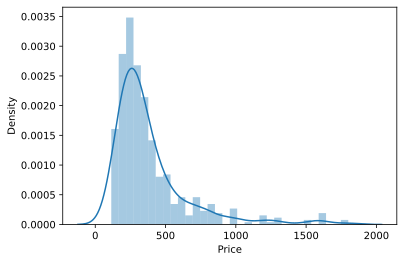

In [957]:
sns.distplot(df['Price'])

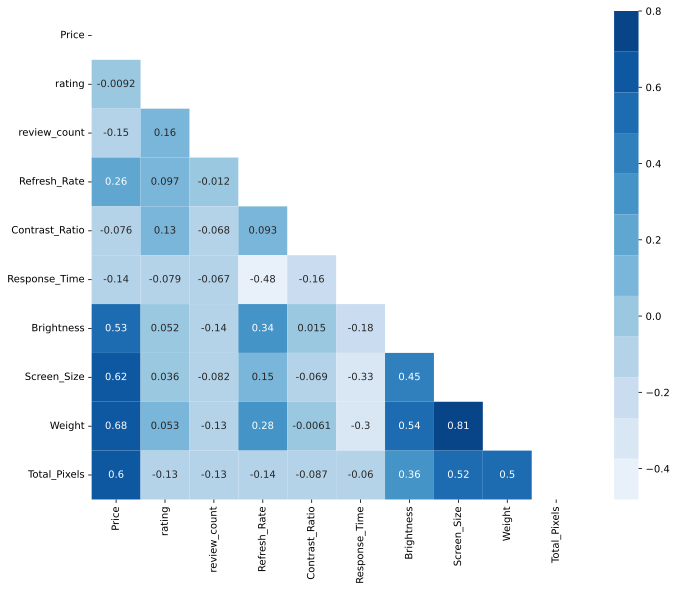

In [978]:
#correlation matrix
corrmat = df.corr()
f, ax = plt.subplots(figsize=(12, 9))
matrix = np.triu(np.ones_like(corrmat))
colormap = sns.color_palette("Blues",12)
sns.heatmap(corrmat,vmax=.8, square=True, annot=True, cmap=colormap,mask=matrix)
plt.savefig('heatmap',bbox_inches="tight",dpi=300)

#### `Total_pixels`, `Weight`,`Screen Size`,`brightness` , `refresh rate` seem to have strong relationship with `Price`

#### Warning of multicolllinearity: 
#### `screen size` &`weight`: 0.81          
#### `screen size` & `total pixels`: 0.52

In [22]:
sns.pairplot(df) 
plt.savefig('Relationship',dpi=300)

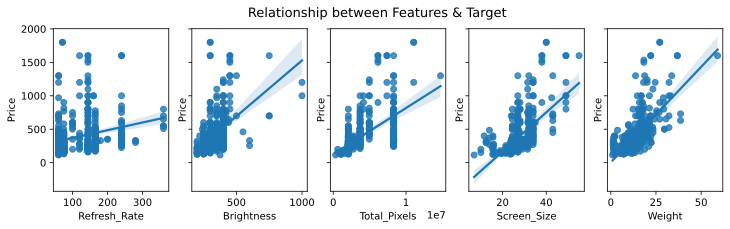

In [919]:
fig, axes = plt.subplots(1, 5,sharey=True,figsize=(12,3))
fig.suptitle('Relationship between Features & Target',fontsize=13)
sns.regplot(ax=axes[0],x="Refresh_Rate", y="Price", data=df)
sns.regplot(ax=axes[1],x="Brightness", y="Price", data=df)
sns.regplot(ax=axes[2],x="Total_Pixels", y="Price", data=df)
sns.regplot(ax=axes[3],x="Screen_Size", y="Price", data=df)
sns.regplot(ax=axes[4],x="Weight", y="Price", data=df)
plt.savefig('Features & Target',bbox_inches="tight",dpi=300)

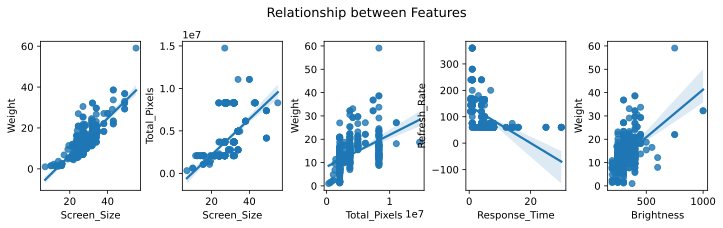

In [979]:
fig, axes = plt.subplots(1, 5,figsize=(10,3))
fig.suptitle('Relationship between Features',fontsize=13)
fig.tight_layout()
sns.regplot(ax=axes[0],x="Screen_Size", y="Weight", data=df)
sns.regplot(ax=axes[1],x="Screen_Size", y="Total_Pixels", data=df)
sns.regplot(ax=axes[2],x="Total_Pixels", y="Weight", data=df)
sns.regplot(ax=axes[3],x="Response_Time", y="Refresh_Rate", data=df)
sns.regplot(ax=axes[4],x="Brightness", y="Weight", data=df)
plt.savefig('Features',bbox_inches="tight",dpi=300)

##### Total_pixels, Weight, Screen Size, brightness seem to be linearlity correlated with price

### Modeling with only numeric data first

In [980]:
numerics = ['int64', 'float64']
df1 = df.select_dtypes(include=numerics)
df1

,Price,rating,review_count,Refresh_Rate,Contrast_Ratio,Response_Time,Brightness,Screen_Size,Weight,Total_Pixels
0,139.99,4.6,1838.0,75.0,1000.0,5.0,250.0,24.0,5.95,2073600
1,139.99,4.7,5106.0,60.0,3000.0,4.0,250.0,24.0,7.30,2073600
2,299.99,4.5,425.0,75.0,1000.0,5.0,250.0,34.0,13.10,2764800
3,299.99,4.8,277.0,165.0,3000.0,2.0,350.0,32.0,22.40,3686400
4,319.99,4.6,1840.0,60.0,1000.0,4.0,300.0,28.0,12.80,8294400
...,...,...,...,...,...,...,...,...,...,...
497,189.99,4.6,1239.0,75.0,3000000.0,4.0,250.0,23.8,9.80,2073600
498,239.99,3.8,5.0,60.0,1000.0,4.0,300.0,28.0,12.80,8294400
499,379.99,3.5,21.0,60.0,700.0,5.0,250.0,15.6,2.00,2073600
500,999.99,4.6,90.0,160.0,1000.0,1.0,400.0,34.0,16.80,4953600


In [1029]:
# Define a modeling&testing workflow

# Define a reusable function for baseline model
def baseline_model(x, y):
    x = sm.add_constant(x)
    model = sm.OLS(y, x)
    fit = model.fit()
       
    return fit.summary() 

# Define a reusable cross valiation function with 60% train, 20% validation, 20% test
def train_val_test(x,y):    
    x, x_test, y, y_test = train_test_split(x, y, test_size=.2,random_state=6)
    x_train, x_val, y_train, y_val = train_test_split(x, y, test_size=.25, random_state=10)

    lm_model = LinearRegression()
    lm_model.fit(x_train, y_train)
    
    print (f"train r score: {round(lm_model.score(x_train, y_train),3)}")
    print (f"validation r score: {round(lm_model.score(x_val, y_val),3)}")
    print (f"test r score: {round(lm_model.score(x_test, y_test),3)}")

#Define a reusable KFold cross validation
def KFold5_cross_validation(x,y):
    x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=.2,random_state=42)

    lm = LinearRegression() 

    kf = KFold(n_splits=5, shuffle=True, random_state = 42) 

    lm_cv = cross_val_score(lm, x_train, y_train, cv= kf, scoring='r2')
    print ('Regression scores: ', lm_cv)
    print ('Mean cv r^2: ', np.round(np.mean(lm_cv), 3), "+-", np.round(np.std(lm_cv),3)) 
    
def KFold3_cross_validation(x,y):
    x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=.2,random_state=42)

    lm = LinearRegression() 

    kf = KFold(n_splits=3, shuffle=True, random_state = 42) 

    lm_cv = cross_val_score(lm, x_train, y_train, cv= kf, scoring='r2')
    print('Regression scores: ', lm_cv)
    print('Mean cv r^2: ', np.round(np.mean(lm_cv), 3), "+-", np.round(np.std(lm_cv),3)) 


#Define a reusable linear diagnostic plots set
def diagnostic_plots(y_pred, y_true, resid):
    fig, axes = plt.subplots(1, 3, figsize=(10, 4))

    g1 = sns.regplot(x=y_pred, y=y_true, ci=False, fit_reg=False, line_kws={'color': 'blue'}, ax=axes[0], scatter_kws={'s': 5})
    g1.set_xlabel('Predicted Target')
    g1.set_ylabel('True Target')
    g1.plot(y_true, y_true, '--', color='gray')

    g2 = sns.regplot(x=y_pred, y=resid, lowess=True, ax=axes[1], line_kws={'color': 'red'}, scatter_kws={'s': 5})
    g2.set_xlabel('Predicted Target')
    g2.set_ylabel('Residual')
    g2.axhline(y=0, color='gray', linestyle='--')

    stats.probplot(resid, dist="norm", plot=axes[2])

    fig.suptitle('Diagnostic Plots')
    fig.tight_layout()

### 1. baseline linear regression model with all numeric data

In [982]:
y = df1['Price']
x = df1.drop(columns = ['Price'])
x = sm.add_constant(x)
model = sm.OLS(y, x)
fit = model.fit()
fit.summary()
#R-squared:0.616                      
# Prob(JB):0.00 indicates non-normality of errors which i'll tackle later

/Users/Layla/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/tsatools.py:142: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only
  x = pd.concat(x[::order], 1)


<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  Price   R-squared:                       0.616
Model:                            OLS   Adj. R-squared:                  0.609
Method:                 Least Squares   F-statistic:                     86.49
Date:                Wed, 15 Jun 2022   Prob (F-statistic):           4.55e-95
Time:                        17:16:36   Log-Likelihood:                -3249.7
No. Observations:                 496   AIC:                             6519.
Df Residuals:                     486   BIC:                             6562.
Df Model:                           9                                         
Covariance Type:            nonrobust                                         
==================================================================================
                     coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------
const           -414.2909     76.457     -5.419      0.000    -564.518    -264.064
rating             3.4965     11.775      0.297      0.767     -19.640      26.633
review_count      -0.0163      0.016     -1.041      0.299      -0.047       0.014
Refresh_Rate       1.0760      0.166      6.479      0.000       0.750       1.402
Contrast_Ratio -2.833e-07   2.38e-07     -1.189      0.235   -7.51e-07    1.85e-07
Response_Time      9.3568      2.292      4.083      0.000       4.854      13.860
Brightness         0.3492      0.113      3.091      0.002       0.127       0.571
Screen_Size        7.5140      2.419      3.106      0.002       2.761      12.267
Weight            11.6788      2.214      5.276      0.000       7.329      16.028
Total_Pixels    4.313e-05   4.22e-06     10.215      0.000    3.48e-05    5.14e-05
==============================================================================
Omnibus:                      247.326   Durbin-Watson:                   1.903
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             1674.416
Skew:                           2.088   Prob(JB):                         0.00
Kurtosis:                      10.974   Cond. No.                     3.70e+08
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 3.7e+08. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [983]:
train_val_test(x,y)

train r score: 0.594
validation r score: 0.629
test r score: 0.658


In [984]:
KFold3_cross_validation(x,y)

Simple regression scores:  [0.54588404 0.59138039 0.5834882 ]
Simple mean cv r^2:  0.574 +- 0.02


In [985]:
KFold5_cross_validation(x,y)

Simple regression scores:  [0.52381485 0.607549   0.59280324 0.01615653 0.63758722]
Simple mean cv r^2:  0.476 +- 0.233


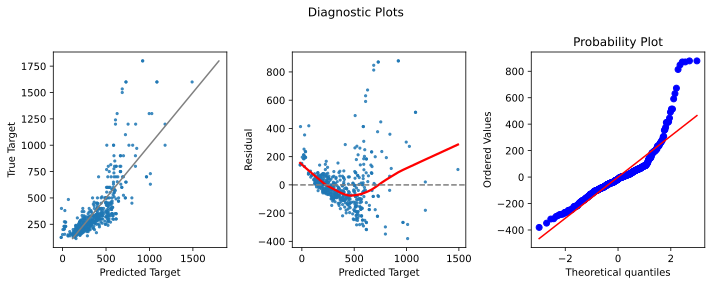

In [986]:
diagnostic_plots(fit.fittedvalues, y, fit.resid)

### 2. drop columns with high p-value: `rating`:0.767;  `review_count`:0.299;  `Contrast_Ratio`:0.235

In [987]:
x = df1.drop(columns = ['Price','rating','review_count','Contrast_Ratio'])
y = df1['Price']
baseline_model(x, y)   
#R-squared:0.616 DROPPED???

/Users/Layla/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/tsatools.py:142: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only
  x = pd.concat(x[::order], 1)


<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  Price   R-squared:                       0.614
Model:                            OLS   Adj. R-squared:                  0.609
Method:                 Least Squares   F-statistic:                     129.6
Date:                Wed, 15 Jun 2022   Prob (F-statistic):           1.05e-97
Time:                        17:16:40   Log-Likelihood:                -3250.9
No. Observations:                 496   AIC:                             6516.
Df Residuals:                     489   BIC:                             6545.
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
=================================================================================
                    coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------
const          -421.9053     58.393     -7.225      0.000    -536.637    -307.173
Refresh_Rate      1.0857      0.166      6.547      0.000       0.760       1.412
Response_Time    10.0574      2.238      4.494      0.000       5.660      14.455
Brightness        0.3544      0.112      3.154      0.002       0.134       0.575
Screen_Size       7.8202      2.395      3.265      0.001       3.115      12.526
Weight           11.6626      2.199      5.303      0.000       7.342      15.984
Total_Pixels   4.348e-05   4.15e-06     10.467      0.000    3.53e-05    5.16e-05
==============================================================================
Omnibus:                      247.650   Durbin-Watson:                   1.901
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             1684.833
Skew:                           2.089   Prob(JB):                         0.00
Kurtosis:                      11.004   Cond. No.                     3.37e+07
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 3.37e+07. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [988]:
train_val_test(x,y)

train r score: 0.59
validation r score: 0.632
test r score: 0.663


In [989]:
KFold3_cross_validation(x,y)

Simple regression scores:  [0.54982307 0.58938155 0.58340056]
Simple mean cv r^2:  0.574 +- 0.017


In [990]:
KFold5_cross_validation(x,y)

Simple regression scores:  [0.53044134 0.6067393  0.59323528 0.01358071 0.63710087]
Simple mean cv r^2:  0.476 +- 0.234


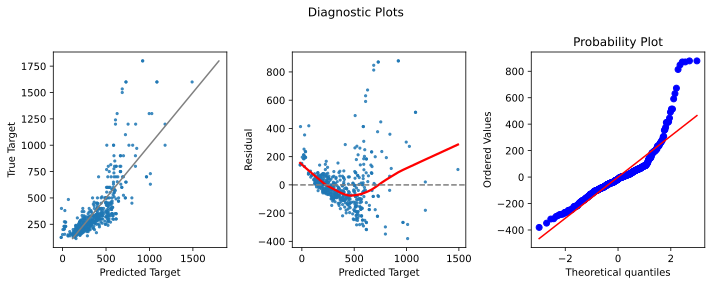

In [991]:
diagnostic_plots(fit.fittedvalues, y, fit.resid)

### 3. Basic feature engineering on baseline model(1): adding polynomial terms

In [992]:
df1['Screen_Size^2']=df1['Screen_Size']**2        # screen size **2
x = df1.drop(columns = ['Price','rating','review_count','Contrast_Ratio'])
y = df1['Price']
baseline_model(x, y)                         
# R-squared boosted !!!    
# p-value of respense_time and brightness changed !!!

/var/folders/4q/s5vk58v95472hjx15zb8y_940000gn/T/ipykernel_1298/1441629080.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df1['Screen_Size^2']=df1['Screen_Size']**2        # screen size **2
/Users/Layla/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/tsatools.py:142: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only
  x = pd.concat(x[::order], 1)


<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  Price   R-squared:                       0.651
Model:                            OLS   Adj. R-squared:                  0.646
Method:                 Least Squares   F-statistic:                     130.1
Date:                Wed, 15 Jun 2022   Prob (F-statistic):          2.62e-107
Time:                        17:18:23   Log-Likelihood:                -3225.8
No. Observations:                 496   AIC:                             6468.
Df Residuals:                     488   BIC:                             6501.
Df Model:                           7                                         
Covariance Type:            nonrobust                                         
=================================================================================
                    coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------
const           345.3637    119.981      2.878      0.004     109.620     581.107
Refresh_Rate      1.1512      0.158      7.284      0.000       0.841       1.462
Response_Time     2.6036      2.367      1.100      0.272      -2.047       7.254
Brightness        0.1701      0.110      1.547      0.122      -0.046       0.386
Screen_Size     -40.2462      7.041     -5.716      0.000     -54.080     -26.412
Weight            9.1477      2.121      4.312      0.000       4.979      13.316
Total_Pixels   4.867e-05   4.02e-06     12.114      0.000    4.08e-05    5.66e-05
Screen_Size^2     0.8211      0.114      7.215      0.000       0.598       1.045
==============================================================================
Omnibus:                      245.370   Durbin-Watson:                   1.976
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             1895.687
Skew:                           2.012   Prob(JB):                         0.00
Kurtosis:                      11.691   Cond. No.                     7.28e+07
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 7.28e+07. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [993]:
train_val_test(x,y)

train r score: 0.634
validation r score: 0.663
test r score: 0.675


In [994]:
KFold3_cross_validation(x,y)

Simple regression scores:  [0.54727586 0.63565979 0.68638074]
Simple mean cv r^2:  0.623 +- 0.057


In [995]:
KFold5_cross_validation(x,y)

Simple regression scores:  [0.4945414  0.6508812  0.65276361 0.162994   0.76107977]
Simple mean cv r^2:  0.544 +- 0.209


#### continue adding polynomial term for `Weight` and drop `Response_Time`

In [996]:
df1['Weight^2']=df1['Weight']**2 # Weight**2
x = df1.drop(columns = ['Price','rating','review_count','Contrast_Ratio','Response_Time'])
y = df1['Price']
baseline_model(x, y)   
# r-squared remains the same
# p-value of wieght**2 is 0.318     #!!!! I'll drop Weight**2
# p-value of brightness increases again                    

/var/folders/4q/s5vk58v95472hjx15zb8y_940000gn/T/ipykernel_1298/1589835890.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df1['Weight^2']=df1['Weight']**2 # Weight**2
/Users/Layla/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/tsatools.py:142: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only
  x = pd.concat(x[::order], 1)


<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  Price   R-squared:                       0.651
Model:                            OLS   Adj. R-squared:                  0.646
Method:                 Least Squares   F-statistic:                     130.0
Date:                Wed, 15 Jun 2022   Prob (F-statistic):          2.90e-107
Time:                        17:18:26   Log-Likelihood:                -3225.9
No. Observations:                 496   AIC:                             6468.
Df Residuals:                     488   BIC:                             6501.
Df Model:                           7                                         
Covariance Type:            nonrobust                                         
=================================================================================
                    coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------
const           487.8050    116.101      4.202      0.000     259.686     715.924
Refresh_Rate      1.0677      0.147      7.274      0.000       0.779       1.356
Brightness        0.1633      0.110      1.483      0.139      -0.053       0.380
Screen_Size     -50.1713      8.700     -5.767      0.000     -67.266     -33.077
Weight           13.1279      4.540      2.891      0.004       4.207      22.049
Total_Pixels   4.847e-05   4.04e-06     12.005      0.000    4.05e-05    5.64e-05
Screen_Size^2     0.9773      0.144      6.775      0.000       0.694       1.261
Weight^2         -0.1063      0.106     -1.000      0.318      -0.315       0.103
==============================================================================
Omnibus:                      239.897   Durbin-Watson:                   1.980
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             1793.918
Skew:                           1.967   Prob(JB):                         0.00
Kurtosis:                      11.445   Cond. No.                     7.05e+07
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 7.05e+07. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [997]:
train_val_test(x,y)

train r score: 0.634
validation r score: 0.661
test r score: 0.677


In [998]:
KFold3_cross_validation(x,y)

Simple regression scores:  [0.54458594 0.63184875 0.68115883]
Simple mean cv r^2:  0.619 +- 0.056


In [999]:
KFold5_cross_validation(x,y)

Simple regression scores:  [0.49091849 0.65460154 0.64763276 0.15893696 0.76149804]
Simple mean cv r^2:  0.543 +- 0.21


#### Adding polynomial term for `Total_Pixels` and drop `Weight^2`

In [1000]:
df1['Total_Pixels^2']=df1['Total_Pixels']**2            # Total_Pixels**2
x = df1.drop(columns = ['Price','rating','review_count','Contrast_Ratio','Response_Time','Weight^2'])
baseline_model(x, y)  
# r-squared slightly increases
# p-value of brightness slightly decreases 
# while p-value of Total_Pixels^2 is 0.055 indicating non-significant and p-value of Total_Pixels increases to 0.255


/var/folders/4q/s5vk58v95472hjx15zb8y_940000gn/T/ipykernel_1298/3134535816.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df1['Total_Pixels^2']=df1['Total_Pixels']**2            # Total_Pixels**2
/Users/Layla/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/tsatools.py:142: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only
  x = pd.concat(x[::order], 1)


<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  Price   R-squared:                       0.653
Model:                            OLS   Adj. R-squared:                  0.648
Method:                 Least Squares   F-statistic:                     131.1
Date:                Wed, 15 Jun 2022   Prob (F-statistic):          7.63e-108
Time:                        17:18:30   Log-Likelihood:                -3224.5
No. Observations:                 496   AIC:                             6465.
Df Residuals:                     488   BIC:                             6499.
Df Model:                           7                                         
Covariance Type:            nonrobust                                         
==================================================================================
                     coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------
const            423.4425     96.416      4.392      0.000     234.000     612.885
Refresh_Rate       1.0984      0.146      7.541      0.000       0.812       1.385
Brightness         0.1698      0.110      1.549      0.122      -0.046       0.385
Screen_Size      -41.0104      6.329     -6.479      0.000     -53.447     -28.574
Weight             9.3160      2.118      4.398      0.000       5.154      13.478
Total_Pixels    1.857e-05   1.63e-05      1.141      0.255   -1.34e-05    5.06e-05
Screen_Size^2      0.8422      0.104      8.129      0.000       0.639       1.046
Total_Pixels^2    2.7e-12    1.4e-12      1.924      0.055   -5.79e-14    5.46e-12
==============================================================================
Omnibus:                      239.635   Durbin-Watson:                   1.958
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             1785.290
Skew:                           1.966   Prob(JB):                         0.00
Kurtosis:                      11.421   Cond. No.                     4.30e+14
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 4.3e+14. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [1001]:
print(train_val_test(x,y))

print(KFold3_cross_validation(x,y))

print(KFold5_cross_validation(x,y))

train r score: 0.637
validation r score: 0.669
test r score: 0.669
None
Simple regression scores:  [0.54646036 0.63629682 0.68611507]
Simple mean cv r^2:  0.623 +- 0.058
None
Simple regression scores:  [0.48739674 0.64157582 0.65364267 0.17435932 0.75882239]
Simple mean cv r^2:  0.543 +- 0.204
None


#### Adding polynomial term for `Brightness` and drop `Total_Pixels^2`

In [1002]:
df1['Brightness^2']=df1['Brightness']**2            # Brightness**2
x = df1.drop(columns = ['Price','rating','review_count','Contrast_Ratio','Response_Time','Weight^2','Total_Pixels^2'])
baseline_model(x, y)  

/var/folders/4q/s5vk58v95472hjx15zb8y_940000gn/T/ipykernel_1298/1800148697.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df1['Brightness^2']=df1['Brightness']**2            # Brightness**2
/Users/Layla/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/tsatools.py:142: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only
  x = pd.concat(x[::order], 1)


<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  Price   R-squared:                       0.661
Model:                            OLS   Adj. R-squared:                  0.656
Method:                 Least Squares   F-statistic:                     135.7
Date:                Wed, 15 Jun 2022   Prob (F-statistic):          3.12e-110
Time:                        17:24:00   Log-Likelihood:                -3218.9
No. Observations:                 496   AIC:                             6454.
Df Residuals:                     488   BIC:                             6487.
Df Model:                           7                                         
Covariance Type:            nonrobust                                         
=================================================================================
                    coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------
const           283.4991    101.970      2.780      0.006      83.145     483.853
Refresh_Rate      0.9462      0.148      6.385      0.000       0.655       1.237
Brightness        1.4038      0.337      4.165      0.000       0.742       2.066
Screen_Size     -50.1138      6.265     -7.999      0.000     -62.424     -37.804
Weight            7.1479      2.153      3.320      0.001       2.918      11.378
Total_Pixels   4.568e-05   4.04e-06     11.297      0.000    3.77e-05    5.36e-05
Screen_Size^2     1.0211      0.108      9.477      0.000       0.809       1.233
Brightness^2     -0.0013      0.000     -3.869      0.000      -0.002      -0.001
==============================================================================
Omnibus:                      222.012   Durbin-Watson:                   2.028
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             1562.183
Skew:                           1.807   Prob(JB):                         0.00
Kurtosis:                      10.907   Cond. No.                     6.27e+07
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 6.27e+07. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [1003]:
print(train_val_test(x,y))

print(KFold3_cross_validation(x,y))

print(KFold5_cross_validation(x,y))

train r score: 0.652
validation r score: 0.643
test r score: 0.682
None
Simple regression scores:  [0.57573296 0.65122041 0.67171087]
Simple mean cv r^2:  0.633 +- 0.041
None
Simple regression scores:  [0.5297959  0.67338603 0.67210379 0.13816824 0.7752311 ]
Simple mean cv r^2:  0.558 +- 0.224
None


#### Adding polynomial term for Refresh_Rate

In [1004]:
df1['Refresh_Rate^2']=df1['Refresh_Rate']**2            # Refresh_Rate**2
x = df1.drop(columns = ['Price','rating','review_count','Contrast_Ratio','Response_Time','Weight^2','Total_Pixels^2'])
baseline_model(x, y) 

#non-significant and r-squared remains the same
#I'll stick to the previous one and continue build on that 

/var/folders/4q/s5vk58v95472hjx15zb8y_940000gn/T/ipykernel_1298/1390431953.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df1['Refresh_Rate^2']=df1['Refresh_Rate']**2            # Refresh_Rate**2
/Users/Layla/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/tsatools.py:142: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only
  x = pd.concat(x[::order], 1)


<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  Price   R-squared:                       0.661
Model:                            OLS   Adj. R-squared:                  0.655
Method:                 Least Squares   F-statistic:                     118.5
Date:                Wed, 15 Jun 2022   Prob (F-statistic):          3.76e-109
Time:                        17:24:02   Log-Likelihood:                -3218.9
No. Observations:                 496   AIC:                             6456.
Df Residuals:                     487   BIC:                             6494.
Df Model:                           8                                         
Covariance Type:            nonrobust                                         
==================================================================================
                     coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------
const            282.9378    102.295      2.766      0.006      81.944     483.932
Refresh_Rate       0.9815      0.448      2.191      0.029       0.101       1.862
Brightness         1.4033      0.337      4.158      0.000       0.740       2.066
Screen_Size      -50.1976      6.351     -7.903      0.000     -62.677     -37.718
Weight             7.1532      2.156      3.318      0.001       2.917      11.390
Total_Pixels    4.572e-05   4.07e-06     11.224      0.000    3.77e-05    5.37e-05
Screen_Size^2      1.0219      0.108      9.434      0.000       0.809       1.235
Brightness^2      -0.0013      0.000     -3.866      0.000      -0.002      -0.001
Refresh_Rate^2    -0.0001      0.001     -0.083      0.934      -0.003       0.003
==============================================================================
Omnibus:                      221.936   Durbin-Watson:                   2.028
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             1559.343
Skew:                           1.807   Prob(JB):                         0.00
Kurtosis:                      10.899   Cond. No.                     6.29e+07
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 6.29e+07. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [1005]:
print(train_val_test(x,y))

print(KFold3_cross_validation(x,y))

print(KFold5_cross_validation(x,y))

train r score: 0.652
validation r score: 0.644
test r score: 0.68
None
Simple regression scores:  [0.57291712 0.65118072 0.66862642]
Simple mean cv r^2:  0.631 +- 0.042
None
Simple regression scores:  [0.52690255 0.67338995 0.66985524 0.12473481 0.76768177]
Simple mean cv r^2:  0.553 +- 0.227
None


In [1006]:
#drop insignificant columns
df1.drop(columns = ['Contrast_Ratio','rating','review_count','Response_Time','Weight^2','Total_Pixels^2','Refresh_Rate^2'],inplace=True)

/Users/Layla/opt/anaconda3/lib/python3.9/site-packages/pandas/core/frame.py:4906: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().drop(


In [1007]:
df1.columns

Index(['Price', 'Refresh_Rate', 'Brightness', 'Screen_Size', 'Weight',
       'Total_Pixels', 'Screen_Size^2', 'Brightness^2'],
      dtype='object')

### Multicollinearity problem: Adding interaction terms

In [1008]:
df1['Screen_Size*Weight']=df1['Screen_Size']*df1['Weight']

x = df1.drop(columns = ['Price'])
baseline_model(x, y) 

# Screen_Size*Weight insignificant

/var/folders/4q/s5vk58v95472hjx15zb8y_940000gn/T/ipykernel_1298/2393374417.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df1['Screen_Size*Weight']=df1['Screen_Size']*df1['Weight']
/Users/Layla/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/tsatools.py:142: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only
  x = pd.concat(x[::order], 1)


<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  Price   R-squared:                       0.661
Model:                            OLS   Adj. R-squared:                  0.655
Method:                 Least Squares   F-statistic:                     118.6
Date:                Wed, 15 Jun 2022   Prob (F-statistic):          3.38e-109
Time:                        17:25:03   Log-Likelihood:                -3218.8
No. Observations:                 496   AIC:                             6456.
Df Residuals:                     487   BIC:                             6493.
Df Model:                           8                                         
Covariance Type:            nonrobust                                         
======================================================================================
                         coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------
const                324.9897    135.185      2.404      0.017      59.371     590.608
Refresh_Rate           0.9392      0.149      6.301      0.000       0.646       1.232
Brightness             1.3985      0.338      4.143      0.000       0.735       2.062
Screen_Size          -54.6580     11.559     -4.729      0.000     -77.369     -31.947
Weight                10.5638      7.611      1.388      0.166      -4.390      25.518
Total_Pixels        4.557e-05   4.05e-06     11.241      0.000    3.76e-05    5.35e-05
Screen_Size^2          1.1288      0.254      4.443      0.000       0.630       1.628
Brightness^2          -0.0013      0.000     -3.860      0.000      -0.002      -0.001
Screen_Size*Weight    -0.1119      0.239     -0.468      0.640      -0.582       0.358
==============================================================================
Omnibus:                      219.690   Durbin-Watson:                   2.029
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             1536.309
Skew:                           1.786   Prob(JB):                         0.00
Kurtosis:                      10.847   Cond. No.                     8.33e+07
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 8.33e+07. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [1009]:
print(train_val_test(x,y))

print(KFold3_cross_validation(x,y))

print(KFold5_cross_validation(x,y))

train r score: 0.652
validation r score: 0.643
test r score: 0.68
None
Simple regression scores:  [0.56892816 0.65097051 0.6601421 ]
Simple mean cv r^2:  0.627 +- 0.041
None
Simple regression scores:  [0.52174643 0.67129624 0.67166668 0.0949191  0.77351923]
Simple mean cv r^2:  0.547 +- 0.24
None


In [1010]:
df1['Screen_Size*Pixel']=df1['Screen_Size']*df1['Total_Pixels']

x = df1.drop(columns = ['Price'])
baseline_model(x, y)

## Screen_Size*Pixel significant and r-squared boosted

/var/folders/4q/s5vk58v95472hjx15zb8y_940000gn/T/ipykernel_1298/1231557146.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df1['Screen_Size*Pixel']=df1['Screen_Size']*df1['Total_Pixels']
/Users/Layla/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/tsatools.py:142: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only
  x = pd.concat(x[::order], 1)


<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  Price   R-squared:                       0.671
Model:                            OLS   Adj. R-squared:                  0.665
Method:                 Least Squares   F-statistic:                     110.3
Date:                Wed, 15 Jun 2022   Prob (F-statistic):          1.97e-111
Time:                        17:25:04   Log-Likelihood:                -3211.0
No. Observations:                 496   AIC:                             6442.
Df Residuals:                     486   BIC:                             6484.
Df Model:                           9                                         
Covariance Type:            nonrobust                                         
======================================================================================
                         coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------
const                308.7615    133.282      2.317      0.021      46.881     570.642
Refresh_Rate           0.9235      0.147      6.285      0.000       0.635       1.212
Brightness             1.6302      0.338      4.826      0.000       0.967       2.294
Screen_Size          -46.3494     11.585     -4.001      0.000     -69.112     -23.587
Weight                14.1565      7.555      1.874      0.062      -0.689      29.002
Total_Pixels       -4.865e-05   2.43e-05     -2.004      0.046   -9.63e-05   -9.51e-07
Screen_Size^2          0.8124      0.263      3.090      0.002       0.296       1.329
Brightness^2          -0.0016      0.000     -4.564      0.000      -0.002      -0.001
Screen_Size*Weight    -0.2576      0.238     -1.080      0.281      -0.726       0.211
Screen_Size*Pixel    3.23e-06   8.21e-07      3.935      0.000    1.62e-06    4.84e-06
==============================================================================
Omnibus:                      163.826   Durbin-Watson:                   2.015
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              991.455
Skew:                           1.299   Prob(JB):                    5.11e-216
Kurtosis:                       9.421   Cond. No.                     2.61e+09
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 2.61e+09. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [1011]:
print(train_val_test(x,y))

print(KFold3_cross_validation(x,y))

print(KFold5_cross_validation(x,y))

train r score: 0.661
validation r score: 0.668
test r score: 0.682
None
Simple regression scores:  [0.53005811 0.65391663 0.66209771]
Simple mean cv r^2:  0.615 +- 0.06
None
Simple regression scores:  [0.4980502  0.65035961 0.67057603 0.0626335  0.77540873]
Simple mean cv r^2:  0.531 +- 0.251
None


#### Remove `Screen_Size*Weight` from model

In [1012]:
x = df1.drop(columns = ['Price','Screen_Size*Weight'])
baseline_model(x, y)
# [Total_Pixels] becomes insignificant but i'll keep it for now

/Users/Layla/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/tsatools.py:142: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only
  x = pd.concat(x[::order], 1)


<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  Price   R-squared:                       0.670
Model:                            OLS   Adj. R-squared:                  0.665
Method:                 Least Squares   F-statistic:                     123.9
Date:                Wed, 15 Jun 2022   Prob (F-statistic):          3.05e-112
Time:                        17:25:05   Log-Likelihood:                -3211.6
No. Observations:                 496   AIC:                             6441.
Df Residuals:                     487   BIC:                             6479.
Df Model:                           8                                         
Covariance Type:            nonrobust                                         
=====================================================================================
                        coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------
const               216.2123    102.120      2.117      0.035      15.562     416.863
Refresh_Rate          0.9399      0.146      6.430      0.000       0.653       1.227
Brightness            1.6323      0.338      4.832      0.000       0.968       2.296
Screen_Size         -36.4916      7.138     -5.112      0.000     -50.517     -22.466
Weight                6.3268      2.135      2.964      0.003       2.133      10.521
Total_Pixels      -4.438e-05    2.4e-05     -1.853      0.065   -9.14e-05    2.69e-06
Screen_Size^2         0.5840      0.156      3.735      0.000       0.277       0.891
Brightness^2         -0.0016      0.000     -4.547      0.000      -0.002      -0.001
Screen_Size*Pixel  3.092e-06   8.11e-07      3.813      0.000     1.5e-06    4.69e-06
==============================================================================
Omnibus:                      171.611   Durbin-Watson:                   2.014
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             1041.901
Skew:                           1.370   Prob(JB):                    5.68e-227
Kurtosis:                       9.550   Cond. No.                     2.00e+09
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large,  2e+09. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [1013]:
print(train_val_test(x,y))

print(KFold3_cross_validation(x,y))

print(KFold5_cross_validation(x,y))

train r score: 0.66
validation r score: 0.669
test r score: 0.681
None
Simple regression scores:  [0.55366974 0.65349925 0.67519426]
Simple mean cv r^2:  0.627 +- 0.053
None
Simple regression scores:  [0.52179811 0.65147355 0.67015009 0.09221796 0.77645673]
Simple mean cv r^2:  0.542 +- 0.239
None


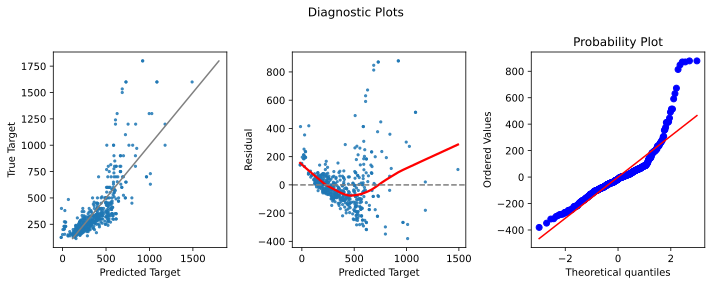

In [1014]:
diagnostic_plots(fit.fittedvalues, y, fit.resid)

In [1015]:
df1.drop(columns = ['Screen_Size*Weight'],inplace=True)

/Users/Layla/opt/anaconda3/lib/python3.9/site-packages/pandas/core/frame.py:4906: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().drop(


In [1016]:
df1

,Price,Refresh_Rate,Brightness,Screen_Size,Weight,Total_Pixels,Screen_Size^2,Brightness^2,Screen_Size*Pixel
0,139.99,75.0,250.0,24.0,5.95,2073600,576.00,62500.0,49766400.0
1,139.99,60.0,250.0,24.0,7.30,2073600,576.00,62500.0,49766400.0
2,299.99,75.0,250.0,34.0,13.10,2764800,1156.00,62500.0,94003200.0
3,299.99,165.0,350.0,32.0,22.40,3686400,1024.00,122500.0,117964800.0
4,319.99,60.0,300.0,28.0,12.80,8294400,784.00,90000.0,232243200.0
...,...,...,...,...,...,...,...,...,...
497,189.99,75.0,250.0,23.8,9.80,2073600,566.44,62500.0,49351680.0
498,239.99,60.0,300.0,28.0,12.80,8294400,784.00,90000.0,232243200.0
499,379.99,60.0,250.0,15.6,2.00,2073600,243.36,62500.0,32348160.0
500,999.99,160.0,400.0,34.0,16.80,4953600,1156.00,160000.0,168422400.0


#### Perform VIF

In [1017]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
y = df1['Price']
x = df1.drop(columns = ['Price'])
baseline_model(x, y)
             
vif = pd.DataFrame()             
vif['variables'] = x.columns
vif['vif'] =[variance_inflation_factor(x.values, i) for i in range(x.shape[1])] 
vif

/Users/Layla/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/tsatools.py:142: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only
  x = pd.concat(x[::order], 1)


,variables,vif
0,Refresh_Rate,6.658167
1,Brightness,187.411616
2,Screen_Size,352.668387
3,Weight,18.849480
4,Total_Pixels,212.890973
5,Screen_Size^2,250.631573
6,Brightness^2,36.551119
7,Screen_Size*Pixel,243.507968


### 3. Fit a polynomial regression on the original numeric data 

In [1018]:
numerics = ['int64', 'float64']
df_ = df.select_dtypes(include=numerics)
df_

,Price,rating,review_count,Refresh_Rate,Contrast_Ratio,Response_Time,Brightness,Screen_Size,Weight,Total_Pixels
0,139.99,4.6,1838.0,75.0,1000.0,5.0,250.0,24.0,5.95,2073600
1,139.99,4.7,5106.0,60.0,3000.0,4.0,250.0,24.0,7.30,2073600
2,299.99,4.5,425.0,75.0,1000.0,5.0,250.0,34.0,13.10,2764800
3,299.99,4.8,277.0,165.0,3000.0,2.0,350.0,32.0,22.40,3686400
4,319.99,4.6,1840.0,60.0,1000.0,4.0,300.0,28.0,12.80,8294400
...,...,...,...,...,...,...,...,...,...,...
497,189.99,4.6,1239.0,75.0,3000000.0,4.0,250.0,23.8,9.80,2073600
498,239.99,3.8,5.0,60.0,1000.0,4.0,300.0,28.0,12.80,8294400
499,379.99,3.5,21.0,60.0,700.0,5.0,250.0,15.6,2.00,2073600
500,999.99,4.6,90.0,160.0,1000.0,1.0,400.0,34.0,16.80,4953600


In [1019]:
y = df_['Price']
x = df_.drop(columns = ['Price'])
x, x_test, y, y_test = train_test_split(x, y,test_size=.2,random_state=10)
x_train, x_val, y_train, y_val = train_test_split(x, y, test_size=.25, random_state=3)

In [1020]:
from sklearn.preprocessing import PolynomialFeatures
from sklearn.metrics import r2_score

# Create polynomial features
poly = PolynomialFeatures(degree=2)
x_train_poly = poly.fit_transform(x_train)

# Apply polynomial transformation to val set
x_val_poly = poly.fit_transform(x_val)

# Fit a model using polynomial features
lr_poly = LinearRegression()
lr_poly.fit(x_train_poly,y_train)

print(lr_poly.score(x_train_poly,y_train))
print(lr_poly.score(x_val_poly,y_val))

#overfit

0.7541031758719153
0.11111936281660728


### 4. Try log transformation

/Users/Layla/opt/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:xlabel='Price', ylabel='Density'>

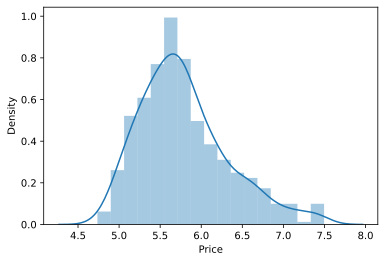

In [1021]:
sns.distplot(np.log(df1.Price)) 

In [1022]:
df1['Log_Price']=np.log(df1.Price)

/var/folders/4q/s5vk58v95472hjx15zb8y_940000gn/T/ipykernel_1298/1631476991.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df1['Log_Price']=np.log(df1.Price)


#### Fit linear regresssion on log y

In [1023]:
y=df1['Log_Price']
x=df1.drop(columns = ['Price','Log_Price'])
baseline_model(x, y)

/Users/Layla/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/tsatools.py:142: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only
  x = pd.concat(x[::order], 1)


<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:              Log_Price   R-squared:                       0.728
Model:                            OLS   Adj. R-squared:                  0.724
Method:                 Least Squares   F-statistic:                     163.3
Date:                Wed, 15 Jun 2022   Prob (F-statistic):          1.34e-132
Time:                        17:25:13   Log-Likelihood:                -75.277
No. Observations:                 496   AIC:                             168.6
Df Residuals:                     487   BIC:                             206.4
Df Model:                           8                                         
Covariance Type:            nonrobust                                         
=====================================================================================
                        coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------
const                 4.7329      0.183     25.831      0.000       4.373       5.093
Refresh_Rate          0.0022      0.000      8.461      0.000       0.002       0.003
Brightness            0.0035      0.001      5.795      0.000       0.002       0.005
Screen_Size          -0.0626      0.013     -4.887      0.000      -0.088      -0.037
Weight                0.0178      0.004      4.641      0.000       0.010       0.025
Total_Pixels       1.611e-07    4.3e-08      3.747      0.000    7.66e-08    2.46e-07
Screen_Size^2         0.0015      0.000      5.182      0.000       0.001       0.002
Brightness^2       -3.15e-06    6.2e-07     -5.078      0.000   -4.37e-06   -1.93e-06
Screen_Size*Pixel -2.141e-09   1.46e-09     -1.471      0.142      -5e-09    7.18e-10
==============================================================================
Omnibus:                       16.772   Durbin-Watson:                   1.958
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               17.659
Skew:                           0.426   Prob(JB):                     0.000146
Kurtosis:                       3.359   Cond. No.                     2.00e+09
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large,  2e+09. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [1024]:
print(train_val_test(x,y))

print(KFold3_cross_validation(x,y))

print(KFold5_cross_validation(x,y))

train r score: 0.738
validation r score: 0.74
test r score: 0.664
None
Simple regression scores:  [0.69955686 0.71784872 0.63479348]
Simple mean cv r^2:  0.684 +- 0.036
None
Simple regression scores:  [0.679269   0.72165913 0.73456801 0.56923704 0.66944311]
Simple mean cv r^2:  0.675 +- 0.058
None


In [1030]:
train_val_test(x,y)

train r score: 0.738
validation r score: 0.74
test r score: 0.664


In [1031]:
KFold3_cross_validation(x,y)

Regression scores:  [0.69955686 0.71784872 0.63479348]
Mean cv r^2:  0.684 +- 0.036


In [1032]:
KFold5_cross_validation(x,y)

Regression scores:  [0.679269   0.72165913 0.73456801 0.56923704 0.66944311]
Mean cv r^2:  0.675 +- 0.058


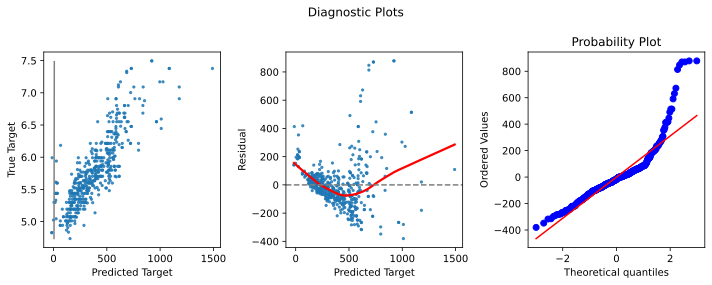

In [1033]:
diagnostic_plots(fit.fittedvalues, y, fit.resid)

### 5. Add Dummies

In [1034]:
df1

,Price,Refresh_Rate,Brightness,Screen_Size,Weight,Total_Pixels,Screen_Size^2,Brightness^2,Screen_Size*Pixel,Log_Price
0,139.99,75.0,250.0,24.0,5.95,2073600,576.00,62500.0,49766400.0,4.941571
1,139.99,60.0,250.0,24.0,7.30,2073600,576.00,62500.0,49766400.0,4.941571
2,299.99,75.0,250.0,34.0,13.10,2764800,1156.00,62500.0,94003200.0,5.703749
3,299.99,165.0,350.0,32.0,22.40,3686400,1024.00,122500.0,117964800.0,5.703749
4,319.99,60.0,300.0,28.0,12.80,8294400,784.00,90000.0,232243200.0,5.768290
...,...,...,...,...,...,...,...,...,...,...
497,189.99,75.0,250.0,23.8,9.80,2073600,566.44,62500.0,49351680.0,5.246971
498,239.99,60.0,300.0,28.0,12.80,8294400,784.00,90000.0,232243200.0,5.480597
499,379.99,60.0,250.0,15.6,2.00,2073600,243.36,62500.0,32348160.0,5.940145
500,999.99,160.0,400.0,34.0,16.80,4953600,1156.00,160000.0,168422400.0,6.907745


In [1035]:
df2 = pd.merge(df1,df,left_index=True, right_index=True,how='inner')

In [1036]:
df2.columns

Index(['Price_x', 'Refresh_Rate_x', 'Brightness_x', 'Screen_Size_x',
       'Weight_x', 'Total_Pixels_x', 'Screen_Size^2', 'Brightness^2',
       'Screen_Size*Pixel', 'Log_Price', 'brand', 'Price_y', 'rating',
       'review_count', 'Refresh_Rate_y', 'Contrast_Ratio', 'Response_Time',
       'Synchronization_Technology', 'Panel_Type', 'Curved_Screen',
       'Brightness_y', 'Screen_Size_y', 'HDR', 'Smart_Display', 'Touch_Screen',
       'Quantum_Dot_Technology', 'Headphone_Jack', 'Voice_Assistant',
       'Wall_Mountable', 'Anti_Glare', 'Speaker', 'Webcam', 'Weight_y',
       'Resolution', 'Total_Pixels_y'],
      dtype='object')

In [1037]:
df2.drop(
    columns=['Price_y', 'rating','review_count', 'Refresh_Rate_y', 'Contrast_Ratio', 'Response_Time', 'Brightness_y', 'Screen_Size_y','Weight_y',
       'Resolution', 'Total_Pixels_y'],inplace=True)
df2.rename(columns={"Price_x": "Price", "Refresh_Rate_x": "Refresh_Rate","Brightness_x": "Brightness","Screen_Size_x": "Screen_Size","Weight_x": "Weight", "Total_Pixels_x": "Total_Pixels" 
    },inplace=True)

In [1038]:
df2.columns

Index(['Price', 'Refresh_Rate', 'Brightness', 'Screen_Size', 'Weight',
       'Total_Pixels', 'Screen_Size^2', 'Brightness^2', 'Screen_Size*Pixel',
       'Log_Price', 'brand', 'Synchronization_Technology', 'Panel_Type',
       'Curved_Screen', 'HDR', 'Smart_Display', 'Touch_Screen',
       'Quantum_Dot_Technology', 'Headphone_Jack', 'Voice_Assistant',
       'Wall_Mountable', 'Anti_Glare', 'Speaker', 'Webcam'],
      dtype='object')

In [1039]:
df3=df2.copy()

In [1040]:
df3=pd.get_dummies(df3, drop_first=True)

#### 5(1). Fit dummies on y=price

In [1041]:
y = df3['Price']
x = df3.drop(columns = ['Price','Log_Price'])
baseline_model(x, y)

/Users/Layla/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/tsatools.py:142: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only
  x = pd.concat(x[::order], 1)


<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  Price   R-squared:                       0.817
Model:                            OLS   Adj. R-squared:                  0.794
Method:                 Least Squares   F-statistic:                     35.60
Date:                Wed, 15 Jun 2022   Prob (F-statistic):          1.28e-129
Time:                        17:35:03   Log-Likelihood:                -3066.3
No. Observations:                 496   AIC:                             6245.
Df Residuals:                     440   BIC:                             6480.
Df Model:                          55                                         
Covariance Type:            nonrobust                                         
==============================================================================================================
                                                 coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------------------
const                                        442.5722    114.782      3.856      0.000     216.983     668.161
Refresh_Rate                                   1.0328      0.158      6.517      0.000       0.721       1.344
Brightness                                     0.9866      0.326      3.031      0.003       0.347       1.626
Screen_Size                                  -36.9996      7.605     -4.865      0.000     -51.947     -22.052
Weight                                         4.1012      1.933      2.121      0.034       0.302       7.901
Total_Pixels                               -5.145e-05   2.04e-05     -2.526      0.012   -9.15e-05   -1.14e-05
Screen_Size^2                                  0.5773      0.149      3.875      0.000       0.284       0.870
Brightness^2                                  -0.0010      0.000     -3.177      0.002      -0.002      -0.000
Screen_Size*Pixel                           3.401e-06   6.89e-07      4.939      0.000    2.05e-06    4.75e-06
brand_AOPEN                                 -255.1696    133.332     -1.914      0.056    -517.216       6.877
brand_ASUS                                   -16.2525     42.496     -0.382      0.702     -99.773      67.268
brand_Acer                                    22.5255     47.347      0.476      0.634     -70.528     115.579
brand_Alienware                               24.3232     67.872      0.358      0.720    -109.070     157.716
brand_Asus                                   -81.6469     84.986     -0.961      0.337    -248.677      85.383
brand_BenQ                                    15.1067     47.376      0.319      0.750     -78.005     108.218
brand_CORSAIR                                 89.7156    102.437      0.876      0.382    -111.611     291.042
brand_Dell                                    25.4890     44.757      0.569      0.569     -62.476     113.454
brand_DoubleSight                           -213.0819    110.621     -1.926      0.055    -430.494       4.330
brand_Element                                -71.7291     82.669     -0.868      0.386    -234.205      90.747
brand_GIGABYTE                               -44.1783     51.754     -0.854      0.394    -145.893      57.536
brand_Geek                                    31.5080    131.618      0.239      0.811    -227.170     290.186
brand_HP                                      91.8001     47.557      1.930      0.054      -1.666     185.266
brand_LG                                      83.8241     42.456      1.974      0.049       0.381     167.267
brand_Lenovo                                  40.6877     44.453      0.915      0.361     -46.678     128.054
brand_MSI                                     31.9001     57.677      0.553      0.580

In [1042]:
print(train_val_test(x,y))

print(KFold3_cross_validation(x,y))

print(KFold5_cross_validation(x,y))

train r score: 0.841
validation r score: 0.712
test r score: 0.709
None
Regression scores:  [0.70105154 0.57974971 0.73952991]
Mean cv r^2:  0.673 +- 0.068
None
Regression scores:  [0.71164945 0.56561971 0.77431709 0.28164836 0.85194107]
Mean cv r^2:  0.637 +- 0.201
None


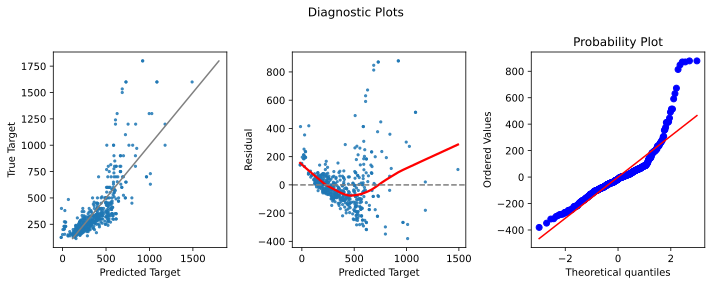

In [1043]:
diagnostic_plots(fit.fittedvalues, y, fit.resid)

#### 5(2). Fit dummies on y=log_price

In [1044]:
y = df3['Log_Price']
x = df3.drop(columns = ['Price','Log_Price'])
baseline_model(x, y)

/Users/Layla/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/tsatools.py:142: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only
  x = pd.concat(x[::order], 1)


<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:              Log_Price   R-squared:                       0.836
Model:                            OLS   Adj. R-squared:                  0.815
Method:                 Least Squares   F-statistic:                     40.73
Date:                Wed, 15 Jun 2022   Prob (F-statistic):          5.71e-140
Time:                        17:35:11   Log-Likelihood:                 49.543
No. Observations:                 496   AIC:                             12.91
Df Residuals:                     440   BIC:                             248.5
Df Model:                          55                                         
Covariance Type:            nonrobust                                         
==============================================================================================================
                                                 coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------------------
const                                          4.6901      0.215     21.855      0.000       4.268       5.112
Refresh_Rate                                   0.0026      0.000      8.756      0.000       0.002       0.003
Brightness                                     0.0021      0.001      3.403      0.001       0.001       0.003
Screen_Size                                   -0.0388      0.014     -2.727      0.007      -0.067      -0.011
Weight                                         0.0136      0.004      3.754      0.000       0.006       0.021
Total_Pixels                                1.485e-07   3.81e-08      3.900      0.000    7.37e-08    2.23e-07
Screen_Size^2                                  0.0011      0.000      3.985      0.000       0.001       0.002
Brightness^2                                -1.89e-06   6.02e-07     -3.141      0.002   -3.07e-06   -7.08e-07
Screen_Size*Pixel                          -1.814e-09   1.29e-09     -1.409      0.160   -4.34e-09    7.16e-10
brand_AOPEN                                   -0.5324      0.249     -2.136      0.033      -1.022      -0.042
brand_ASUS                                    -0.0195      0.079     -0.245      0.806      -0.176       0.137
brand_Acer                                     0.0129      0.089      0.145      0.885      -0.161       0.187
brand_Alienware                                0.1314      0.127      1.036      0.301      -0.118       0.381
brand_Asus                                    -0.0626      0.159     -0.394      0.694      -0.375       0.250
brand_BenQ                                     0.0480      0.089      0.542      0.588      -0.126       0.222
brand_CORSAIR                                  0.2310      0.192      1.206      0.228      -0.145       0.607
brand_Dell                                     0.1184      0.084      1.414      0.158      -0.046       0.283
brand_DoubleSight                             -0.1507      0.207     -0.729      0.467      -0.557       0.256
brand_Element                                 -0.1332      0.155     -0.862      0.389      -0.437       0.171
brand_GIGABYTE                                -0.0281      0.097     -0.291      0.772      -0.218       0.162
brand_Geek                                     0.1552      0.246      0.631      0.529      -0.328       0.639
brand_HP                                       0.2091      0.089      2.352      0.019       0.034       0.384
brand_LG                                       0.1544      0.079      1.945      0.052      -0.002       0.310
brand_Lenovo                                   0.1177      0.083      1.416      0.157      -0.046       0.281
brand_MSI                                      0.0556      0.108      0.515      0.607

In [1050]:
print(train_val_test(x,y))

print(KFold3_cross_validation(x,y))

print(KFold5_cross_validation(x,y))

train r score: 0.851
validation r score: 0.789
test r score: 0.723
None
Regression scores:  [0.74531605 0.72603497 0.73027329]
Mean cv r^2:  0.734 +- 0.008
None
Regression scores:  [0.78341605 0.66847107 0.82317504 0.66866058 0.75132861]
Mean cv r^2:  0.739 +- 0.062
None


In [1051]:
train_val_test(x,y)

train r score: 0.851
validation r score: 0.789
test r score: 0.723


In [1052]:
KFold3_cross_validation(x,y)

Regression scores:  [0.74531605 0.72603497 0.73027329]
Mean cv r^2:  0.734 +- 0.008


In [1053]:
KFold5_cross_validation(x,y)

Regression scores:  [0.78341605 0.66847107 0.82317504 0.66866058 0.75132861]
Mean cv r^2:  0.739 +- 0.062


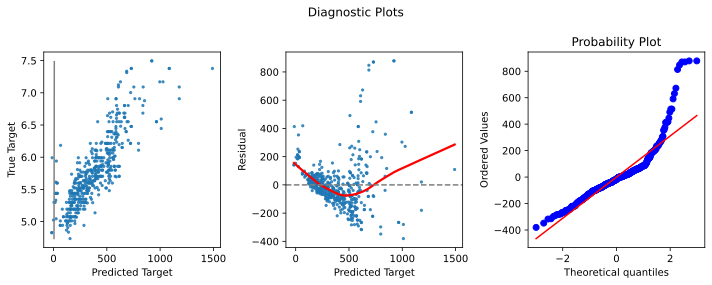

In [1054]:
diagnostic_plots(fit.fittedvalues, y, fit.resid)

##### Some data wrangling

In [1055]:
df2['Panel_Type'].value_counts()     #IPS got dropped by drop_first=True

IPS               269
VA                125
Not Applicable     54
TN                 25
MVA                13
TFT                 9
PLS                 1
Name: Panel_Type, dtype: int64

In [1056]:
df2['Synchronization_Technology'].value_counts()   #FreeSync got dropped by drop_first=True

FreeSync           229
Not Applicable     170
FreeSync&G-SYNC     57
G-SYNC              29
VSync                9
G-SYNC&VSync         2
Name: Synchronization_Technology, dtype: int64

In [1057]:
df4=df2.copy()

In [1058]:
# I want 'Not Applicable' to drop
# Rename 
df4['Synchronization_Technology']=df4['Synchronization_Technology'].str.replace("Not Applicable","A_Not Applicable")
df4['Panel_Type']=df4['Panel_Type'].str.replace("Not Applicable","A_Not Applicable")

In [1059]:
df4['Synchronization_Technology'].value_counts()  

FreeSync            229
A_Not Applicable    170
FreeSync&G-SYNC      57
G-SYNC               29
VSync                 9
G-SYNC&VSync          2
Name: Synchronization_Technology, dtype: int64

In [1060]:
df4['brand'].value_counts()  

Samsung        92
LG             76
ViewSonic      53
ASUS           52
Dell           31
Acer           31
Lenovo         28
HP             25
BenQ           22
GIGABYTE       19
AOC            14
MSI             9
Philips         8
Alienware       6
Viotek          6
SideTrak        5
Razer           3
Asus            3
Element         3
DoubleSight     3
CORSAIR         2
VIOTEK          1
NHT             1
Geek            1
AOPEN           1
Viewsonic       1
Name: brand, dtype: int64

In [1061]:
df4['brand']=df4['brand'].str.replace("Samsung","AA_Samsung") 
#rename Samsung to make sure it gets dropped so that I can compare other brand with Samsung

In [1062]:
df5=pd.get_dummies(df4, drop_first=True)

#### 5(3). Fit new dummies on y=price

In [1063]:
y = df5['Price']
x = df5.drop(columns = ['Price','Log_Price'])
baseline_model(x, y)

/Users/Layla/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/tsatools.py:142: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only
  x = pd.concat(x[::order], 1)


<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  Price   R-squared:                       0.817
Model:                            OLS   Adj. R-squared:                  0.794
Method:                 Least Squares   F-statistic:                     35.60
Date:                Wed, 15 Jun 2022   Prob (F-statistic):          1.28e-129
Time:                        17:36:44   Log-Likelihood:                -3066.3
No. Observations:                 496   AIC:                             6245.
Df Residuals:                     440   BIC:                             6480.
Df Model:                          55                                         
Covariance Type:            nonrobust                                         
==============================================================================================================
                                                 coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------------------
const                                        302.5291    115.596      2.617      0.009      75.340     529.719
Refresh_Rate                                   1.0328      0.158      6.517      0.000       0.721       1.344
Brightness                                     0.9866      0.326      3.031      0.003       0.347       1.626
Screen_Size                                  -36.9996      7.605     -4.865      0.000     -51.947     -22.052
Weight                                         4.1012      1.933      2.121      0.034       0.302       7.901
Total_Pixels                               -5.145e-05   2.04e-05     -2.526      0.012   -9.15e-05   -1.14e-05
Screen_Size^2                                  0.5773      0.149      3.875      0.000       0.284       0.870
Brightness^2                                  -0.0010      0.000     -3.177      0.002      -0.002      -0.000
Screen_Size*Pixel                           3.401e-06   6.89e-07      4.939      0.000    2.05e-06    4.75e-06
brand_AOC                                     41.5574     40.765      1.019      0.309     -38.562     121.677
brand_AOPEN                                 -213.6122    128.932     -1.657      0.098    -467.011      39.786
brand_ASUS                                    25.3049     30.064      0.842      0.400     -33.782      84.392
brand_Acer                                    64.0829     33.212      1.930      0.054      -1.191     129.356
brand_Alienware                               65.8806     62.256      1.058      0.291     -56.475     188.236
brand_Asus                                   -40.0895     79.106     -0.507      0.613    -195.563     115.384
brand_BenQ                                    56.6641     36.655      1.546      0.123     -15.376     128.704
brand_CORSAIR                                131.2730     96.959      1.354      0.176     -59.287     321.833
brand_Dell                                    67.0464     34.541      1.941      0.053      -0.840     134.932
brand_DoubleSight                           -171.5245    114.188     -1.502      0.134    -395.947      52.898
brand_Element                                -30.1717     75.856     -0.398      0.691    -179.257     118.913
brand_GIGABYTE                                -2.6210     39.595     -0.066      0.947     -80.440      75.198
brand_Geek                                    73.0654    128.583      0.568      0.570    -179.648     325.779
brand_HP                                     133.3575     37.393      3.566      0.000      59.867     206.848
brand_LG                                     125.3815     27.356      4.583      0.000      71.618     179.145
brand_Lenovo                                  82.2451     34.286      2.399      0.017

In [1064]:
print(train_val_test(x,y))

print(KFold3_cross_validation(x,y))

print(KFold5_cross_validation(x,y))

train r score: 0.841
validation r score: 0.709
test r score: 0.704
None
Regression scores:  [0.70196921 0.57955059 0.74084213]
Mean cv r^2:  0.674 +- 0.069
None
Regression scores:  [0.71028283 0.5650972  0.77415142 0.28164837 0.85447826]
Mean cv r^2:  0.637 +- 0.201
None


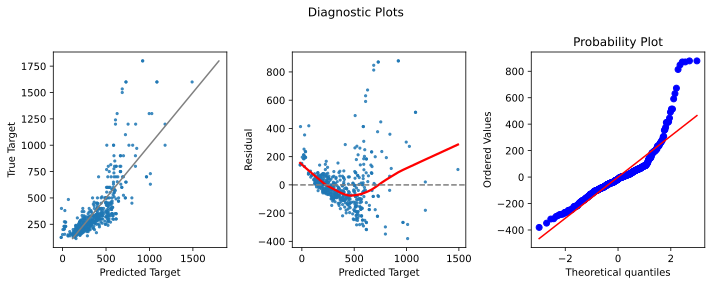

In [1065]:
diagnostic_plots(fit.fittedvalues, y, fit.resid)

#### 5(4). Fit new dummies on y=log_Price

In [1066]:
y= df5['Log_Price']
x = df5.drop(columns = ['Price','Log_Price'])
baseline_model(x, y)

/Users/Layla/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/tsatools.py:142: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only
  x = pd.concat(x[::order], 1)


<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:              Log_Price   R-squared:                       0.836
Model:                            OLS   Adj. R-squared:                  0.815
Method:                 Least Squares   F-statistic:                     40.73
Date:                Wed, 15 Jun 2022   Prob (F-statistic):          5.71e-140
Time:                        17:36:47   Log-Likelihood:                 49.543
No. Observations:                 496   AIC:                             12.91
Df Residuals:                     440   BIC:                             248.5
Df Model:                          55                                         
Covariance Type:            nonrobust                                         
==============================================================================================================
                                                 coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------------------
const                                          4.6081      0.216     21.321      0.000       4.183       5.033
Refresh_Rate                                   0.0026      0.000      8.756      0.000       0.002       0.003
Brightness                                     0.0021      0.001      3.403      0.001       0.001       0.003
Screen_Size                                   -0.0388      0.014     -2.727      0.007      -0.067      -0.011
Weight                                         0.0136      0.004      3.754      0.000       0.006       0.021
Total_Pixels                                1.485e-07   3.81e-08      3.900      0.000    7.37e-08    2.23e-07
Screen_Size^2                                  0.0011      0.000      3.985      0.000       0.001       0.002
Brightness^2                                -1.89e-06   6.02e-07     -3.141      0.002   -3.07e-06   -7.08e-07
Screen_Size*Pixel                          -1.814e-09   1.29e-09     -1.409      0.160   -4.34e-09    7.16e-10
brand_AOC                                     -0.0142      0.076     -0.186      0.852      -0.164       0.136
brand_AOPEN                                   -0.5466      0.241     -2.267      0.024      -1.020      -0.073
brand_ASUS                                    -0.0337      0.056     -0.599      0.549      -0.144       0.077
brand_Acer                                    -0.0013      0.062     -0.021      0.983      -0.123       0.121
brand_Alienware                                0.1172      0.116      1.007      0.314      -0.112       0.346
brand_Asus                                    -0.0768      0.148     -0.520      0.604      -0.368       0.214
brand_BenQ                                     0.0338      0.069      0.493      0.622      -0.101       0.168
brand_CORSAIR                                  0.2168      0.181      1.196      0.232      -0.139       0.573
brand_Dell                                     0.1042      0.065      1.613      0.107      -0.023       0.231
brand_DoubleSight                             -0.1649      0.213     -0.773      0.440      -0.585       0.255
brand_Element                                 -0.1474      0.142     -1.039      0.299      -0.426       0.131
brand_GIGABYTE                                -0.0423      0.074     -0.572      0.568      -0.188       0.103
brand_Geek                                     0.1410      0.240      0.586      0.558      -0.331       0.613
brand_HP                                       0.1949      0.070      2.788      0.006       0.057       0.332
brand_LG                                       0.1402      0.051      2.741      0.006       0.040       0.241
brand_Lenovo                                   0.1035      0.064      1.615      0.107

In [1067]:
print(train_val_test(x,y))

print(KFold3_cross_validation(x,y))

print(KFold5_cross_validation(x,y))

train r score: 0.851
validation r score: 0.791
test r score: 0.724
None
Regression scores:  [0.7516161  0.72604438 0.72892018]
Mean cv r^2:  0.736 +- 0.011
None
Regression scores:  [0.78822478 0.67068485 0.82284472 0.66866058 0.74858826]
Mean cv r^2:  0.74 +- 0.062
None


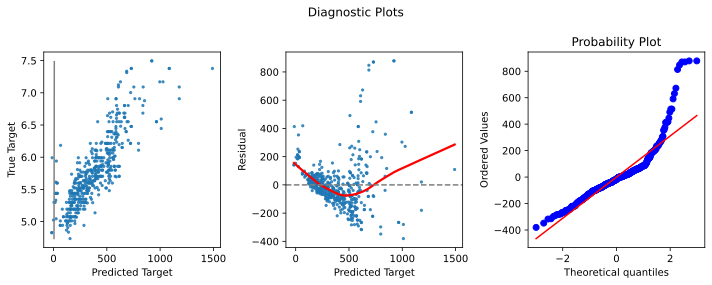

In [1068]:
diagnostic_plots(fit.fittedvalues, y, fit.resid)

#### See if dropping more outliners helps

In [1069]:
df4[df4['Price']>1500]

,Price,Refresh_Rate,Brightness,Screen_Size,Weight,Total_Pixels,Screen_Size^2,Brightness^2,Screen_Size*Pixel,Log_Price,...,HDR,Smart_Display,Touch_Screen,Quantum_Dot_Technology,Headphone_Jack,Voice_Assistant,Wall_Mountable,Anti_Glare,Speaker,Webcam
44,1599.99,240.0,300.0,49.0,36.81,7372800,2401.0,90000.0,361267200.0,7.377753,...,Yes,No,No,Yes,Yes,No,Yes,No,No,No
86,1799.99,71.0,300.0,40.0,27.10,11059200,1600.0,90000.0,442368000.0,7.495536,...,Yes,No,No,No,Yes,No,Yes,No,Yes,No
151,1533.99,144.0,450.0,38.0,18.30,6144000,1444.0,202500.0,233472000.0,7.335627,...,Yes,No,No,No,Yes,No,Yes,Yes,No,No
169,1599.99,144.0,450.0,38.0,22.10,6144000,1444.0,202500.0,233472000.0,7.377753,...,Yes,No,No,No,Yes,No,Yes,No,No,No
204,1599.99,120.0,750.0,55.0,59.09,8294400,3025.0,562500.0,456192000.0,7.377753,...,Yes,No,No,No,Yes,No,No,No,Yes,No
427,1599.99,240.0,300.0,49.0,36.81,7372800,2401.0,90000.0,361267200.0,7.377753,...,Yes,No,No,Yes,Yes,No,Yes,No,No,No
441,1799.99,71.0,300.0,40.0,27.10,11059200,1600.0,90000.0,442368000.0,7.495536,...,Yes,No,No,No,Yes,No,Yes,No,Yes,No
487,1599.99,144.0,450.0,38.0,22.10,6144000,1444.0,202500.0,233472000.0,7.377753,...,Yes,No,No,No,Yes,No,Yes,No,No,No


In [1070]:
df6 = df4.loc[df4['Price'] <= 1500,:]
df6.shape

(488, 24)

/Users/Layla/opt/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:xlabel='Price', ylabel='Density'>

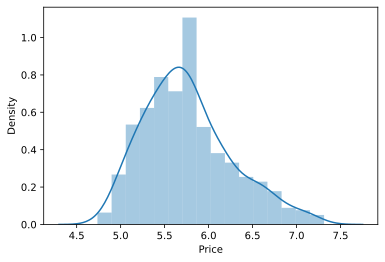

In [1071]:
sns.distplot(np.log(df6.Price)) 

In [1072]:
# y= df6['Log_Price']
# x = df6.drop(columns = ['Price','Log_Price'])
# baseline_model(x, y)

In [1073]:
# print(train_val_test(x,y))

# print(KFold3_cross_validation(x,y))
 
# print(KFold5_cross_validation(x,y))          #dropping more outliers not really helps, so stick with the previous data

In [1074]:
# diagnostic_plots(fit.fittedvalues, y, fit.resid)

### 6(1): Fit a polynomial regression(2): w/ dummies and y=price

In [1075]:
x_poly=df5.drop(columns = ['Price','Log_Price','Screen_Size^2','Brightness^2','Screen_Size*Pixel'])
y=df5['Price']

In [1076]:
x_poly.columns

Index(['Refresh_Rate', 'Brightness', 'Screen_Size', 'Weight', 'Total_Pixels',
       'brand_AOC', 'brand_AOPEN', 'brand_ASUS', 'brand_Acer',
       'brand_Alienware', 'brand_Asus', 'brand_BenQ', 'brand_CORSAIR',
       'brand_Dell', 'brand_DoubleSight', 'brand_Element', 'brand_GIGABYTE',
       'brand_Geek', 'brand_HP', 'brand_LG', 'brand_Lenovo', 'brand_MSI',
       'brand_NHT', 'brand_Philips', 'brand_Razer', 'brand_SideTrak',
       'brand_VIOTEK', 'brand_ViewSonic', 'brand_Viewsonic', 'brand_Viotek',
       'Synchronization_Technology_FreeSync',
       'Synchronization_Technology_FreeSync&G-SYNC',
       'Synchronization_Technology_G-SYNC',
       'Synchronization_Technology_G-SYNC&VSync',
       'Synchronization_Technology_VSync', 'Panel_Type_IPS', 'Panel_Type_MVA',
       'Panel_Type_PLS', 'Panel_Type_TFT', 'Panel_Type_TN', 'Panel_Type_VA',
       'Curved_Screen_Yes', 'HDR_Yes', 'Smart_Display_Yes', 'Touch_Screen_Yes',
       'Quantum_Dot_Technology_Yes', 'Headphone_Jack_Yes',
  

In [1077]:
x_train, x_test, y_train, y_test = train_test_split(x_poly, y, test_size=0.2,random_state=42)

In [1078]:
poly = PolynomialFeatures()

poly_model = LinearRegression()
poly_model.fit(poly.fit_transform(x_train), y_train)

y_pred_train = poly_model.predict(poly.transform(x_train))
y_pred_test = poly_model.predict(poly.transform(x_test))

print(r2_score(y_train, y_pred_train))                   
print(r2_score(y_test, y_pred_test))                   

0.9868820646150117
-2.988110944663379


### 6(1): Fit a polynomial regression(2): w/ dummies & y_log=Log_Price

In [1079]:
x_poly1=df5.drop(columns=['Price','Log_Price','Screen_Size^2','Brightness^2','Screen_Size*Pixel'])
ylog=df5['Log_Price']

In [1080]:
x_train, x_test, ylog_train, ylog_test = train_test_split(x_poly1, ylog, test_size=0.2,random_state=42)

In [1081]:
x_train.columns

Index(['Refresh_Rate', 'Brightness', 'Screen_Size', 'Weight', 'Total_Pixels',
       'brand_AOC', 'brand_AOPEN', 'brand_ASUS', 'brand_Acer',
       'brand_Alienware', 'brand_Asus', 'brand_BenQ', 'brand_CORSAIR',
       'brand_Dell', 'brand_DoubleSight', 'brand_Element', 'brand_GIGABYTE',
       'brand_Geek', 'brand_HP', 'brand_LG', 'brand_Lenovo', 'brand_MSI',
       'brand_NHT', 'brand_Philips', 'brand_Razer', 'brand_SideTrak',
       'brand_VIOTEK', 'brand_ViewSonic', 'brand_Viewsonic', 'brand_Viotek',
       'Synchronization_Technology_FreeSync',
       'Synchronization_Technology_FreeSync&G-SYNC',
       'Synchronization_Technology_G-SYNC',
       'Synchronization_Technology_G-SYNC&VSync',
       'Synchronization_Technology_VSync', 'Panel_Type_IPS', 'Panel_Type_MVA',
       'Panel_Type_PLS', 'Panel_Type_TFT', 'Panel_Type_TN', 'Panel_Type_VA',
       'Curved_Screen_Yes', 'HDR_Yes', 'Smart_Display_Yes', 'Touch_Screen_Yes',
       'Quantum_Dot_Technology_Yes', 'Headphone_Jack_Yes',
  

In [1082]:
poly = PolynomialFeatures()

poly_model = LinearRegression()
poly_model.fit(poly.fit_transform(x_train), ylog_train)

ylog_pred_train = poly_model.predict(poly.transform(x_train))
ylog_pred_test = poly_model.predict(poly.transform(x_test))

print(r2_score(ylog_train, ylog_pred_train))                   
print(r2_score(ylog_test, ylog_pred_test))                  
                                                             

0.9767727663116393
-0.7922089686608087


# The best model so far is 5(4). Fit new dummies on y=log_Price
#### Next step is looking into dummy variables one by one and improve r score

In [1083]:
y= df5['Log_Price']
x = df5.drop(columns = ['Price','Log_Price'])
baseline_model(x, y)

/Users/Layla/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/tsatools.py:142: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only
  x = pd.concat(x[::order], 1)


<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:              Log_Price   R-squared:                       0.836
Model:                            OLS   Adj. R-squared:                  0.815
Method:                 Least Squares   F-statistic:                     40.73
Date:                Wed, 15 Jun 2022   Prob (F-statistic):          5.71e-140
Time:                        17:37:09   Log-Likelihood:                 49.543
No. Observations:                 496   AIC:                             12.91
Df Residuals:                     440   BIC:                             248.5
Df Model:                          55                                         
Covariance Type:            nonrobust                                         
==============================================================================================================
                                                 coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------------------
const                                          4.6081      0.216     21.321      0.000       4.183       5.033
Refresh_Rate                                   0.0026      0.000      8.756      0.000       0.002       0.003
Brightness                                     0.0021      0.001      3.403      0.001       0.001       0.003
Screen_Size                                   -0.0388      0.014     -2.727      0.007      -0.067      -0.011
Weight                                         0.0136      0.004      3.754      0.000       0.006       0.021
Total_Pixels                                1.485e-07   3.81e-08      3.900      0.000    7.37e-08    2.23e-07
Screen_Size^2                                  0.0011      0.000      3.985      0.000       0.001       0.002
Brightness^2                                -1.89e-06   6.02e-07     -3.141      0.002   -3.07e-06   -7.08e-07
Screen_Size*Pixel                          -1.814e-09   1.29e-09     -1.409      0.160   -4.34e-09    7.16e-10
brand_AOC                                     -0.0142      0.076     -0.186      0.852      -0.164       0.136
brand_AOPEN                                   -0.5466      0.241     -2.267      0.024      -1.020      -0.073
brand_ASUS                                    -0.0337      0.056     -0.599      0.549      -0.144       0.077
brand_Acer                                    -0.0013      0.062     -0.021      0.983      -0.123       0.121
brand_Alienware                                0.1172      0.116      1.007      0.314      -0.112       0.346
brand_Asus                                    -0.0768      0.148     -0.520      0.604      -0.368       0.214
brand_BenQ                                     0.0338      0.069      0.493      0.622      -0.101       0.168
brand_CORSAIR                                  0.2168      0.181      1.196      0.232      -0.139       0.573
brand_Dell                                     0.1042      0.065      1.613      0.107      -0.023       0.231
brand_DoubleSight                             -0.1649      0.213     -0.773      0.440      -0.585       0.255
brand_Element                                 -0.1474      0.142     -1.039      0.299      -0.426       0.131
brand_GIGABYTE                                -0.0423      0.074     -0.572      0.568      -0.188       0.103
brand_Geek                                     0.1410      0.240      0.586      0.558      -0.331       0.613
brand_HP                                       0.1949      0.070      2.788      0.006       0.057       0.332
brand_LG                                       0.1402      0.051      2.741      0.006       0.040       0.241
brand_Lenovo                                   0.1035      0.064      1.615      0.107

In [1084]:
print(train_val_test(x,y))                #quite overfitting

print(KFold3_cross_validation(x,y))

print(KFold5_cross_validation(x,y))

train r score: 0.851
validation r score: 0.791
test r score: 0.724
None
Regression scores:  [0.7516161  0.72604438 0.72892018]
Mean cv r^2:  0.736 +- 0.011
None
Regression scores:  [0.78822478 0.67068485 0.82284472 0.66866058 0.74858826]
Mean cv r^2:  0.74 +- 0.062
None


In [1085]:
df4['brand'].value_counts()

AA_Samsung     92
LG             76
ViewSonic      53
ASUS           52
Dell           31
Acer           31
Lenovo         28
HP             25
BenQ           22
GIGABYTE       19
AOC            14
MSI             9
Philips         8
Alienware       6
Viotek          6
SideTrak        5
Razer           3
Asus            3
Element         3
DoubleSight     3
CORSAIR         2
VIOTEK          1
NHT             1
Geek            1
AOPEN           1
Viewsonic       1
Name: brand, dtype: int64

In [1086]:
df4

,Price,Refresh_Rate,Brightness,Screen_Size,Weight,Total_Pixels,Screen_Size^2,Brightness^2,Screen_Size*Pixel,Log_Price,...,HDR,Smart_Display,Touch_Screen,Quantum_Dot_Technology,Headphone_Jack,Voice_Assistant,Wall_Mountable,Anti_Glare,Speaker,Webcam
0,139.99,75.0,250.0,24.0,5.95,2073600,576.00,62500.0,49766400.0,4.941571,...,No,No,No,No,No,No,Yes,No,No,No
1,139.99,60.0,250.0,24.0,7.30,2073600,576.00,62500.0,49766400.0,4.941571,...,No,No,No,No,Yes,No,Yes,No,No,No
2,299.99,75.0,250.0,34.0,13.10,2764800,1156.00,62500.0,94003200.0,5.703749,...,Yes,No,No,No,Yes,No,Yes,Yes,No,No
3,299.99,165.0,350.0,32.0,22.40,3686400,1024.00,122500.0,117964800.0,5.703749,...,No,No,No,No,Yes,No,Yes,Yes,No,No
4,319.99,60.0,300.0,28.0,12.80,8294400,784.00,90000.0,232243200.0,5.768290,...,Yes,No,No,No,No,No,Yes,No,No,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
497,189.99,75.0,250.0,23.8,9.80,2073600,566.44,62500.0,49351680.0,5.246971,...,No,No,No,No,No,No,Yes,Yes,Yes,No
498,239.99,60.0,300.0,28.0,12.80,8294400,784.00,90000.0,232243200.0,5.480597,...,Yes,No,No,No,Yes,No,Yes,No,No,No
499,379.99,60.0,250.0,15.6,2.00,2073600,243.36,62500.0,32348160.0,5.940145,...,No,No,No,No,No,No,No,Yes,No,No
500,999.99,160.0,400.0,34.0,16.80,4953600,1156.00,160000.0,168422400.0,6.907745,...,Yes,No,No,No,Yes,No,Yes,No,No,No


In [1087]:
df7=df4.copy()

In [1088]:
brand_count=df7['brand'].value_counts()
small_brand=list(brand_count[brand_count<20].index)
df7['brand'] = df7['brand'].replace(small_brand, 'other')

In [1089]:
df7['brand'].value_counts()

AA_Samsung    92
other         86
LG            76
ViewSonic     53
ASUS          52
Dell          31
Acer          31
Lenovo        28
HP            25
BenQ          22
Name: brand, dtype: int64

In [1090]:
df7=pd.get_dummies(df7, drop_first=True)

In [1091]:
y= df7['Log_Price']
x = df7.drop(columns = ['Price','Log_Price','Smart_Display_Yes','HDR_Yes','Anti_Glare_Yes','Voice_Assistant_Yes'])
baseline_model(x, y)

/Users/Layla/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/tsatools.py:142: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only
  x = pd.concat(x[::order], 1)


<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:              Log_Price   R-squared:                       0.816
Model:                            OLS   Adj. R-squared:                  0.802
Method:                 Least Squares   F-statistic:                     58.33
Date:                Wed, 15 Jun 2022   Prob (F-statistic):          4.95e-146
Time:                        17:37:16   Log-Likelihood:                 21.425
No. Observations:                 496   AIC:                             29.15
Df Residuals:                     460   BIC:                             180.6
Df Model:                          35                                         
Covariance Type:            nonrobust                                         
==============================================================================================================
                                                 coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------------------
const                                          4.7008      0.190     24.692      0.000       4.327       5.075
Refresh_Rate                                   0.0026      0.000      8.930      0.000       0.002       0.003
Brightness                                     0.0027      0.001      4.484      0.000       0.001       0.004
Screen_Size                                   -0.0500      0.013     -3.991      0.000      -0.075      -0.025
Weight                                         0.0164      0.003      4.726      0.000       0.010       0.023
Total_Pixels                                1.657e-07   3.82e-08      4.344      0.000    9.08e-08    2.41e-07
Screen_Size^2                                  0.0013      0.000      4.990      0.000       0.001       0.002
Brightness^2                               -2.394e-06   5.95e-07     -4.021      0.000   -3.56e-06   -1.22e-06
Screen_Size*Pixel                          -2.428e-09   1.29e-09     -1.883      0.060   -4.96e-09    1.06e-10
brand_ASUS                                    -0.1166      0.051     -2.276      0.023      -0.217      -0.016
brand_Acer                                    -0.0506      0.061     -0.834      0.405      -0.170       0.069
brand_BenQ                                    -0.0379      0.067     -0.569      0.570      -0.169       0.093
brand_Dell                                     0.0077      0.057      0.136      0.892      -0.104       0.120
brand_HP                                       0.0660      0.059      1.116      0.265      -0.050       0.182
brand_LG                                       0.0849      0.045      1.882      0.060      -0.004       0.174
brand_Lenovo                                  -0.0088      0.058     -0.152      0.879      -0.122       0.105
brand_ViewSonic                               -0.1212      0.056     -2.175      0.030      -0.231      -0.012
brand_other                                   -0.0682      0.042     -1.637      0.102      -0.150       0.014
Synchronization_Technology_FreeSync           -0.0802      0.030     -2.657      0.008      -0.140      -0.021
Synchronization_Technology_FreeSync&G-SYNC     0.0279      0.051      0.552      0.581      -0.071       0.127
Synchronization_Technology_G-SYNC              0.0963      0.062      1.565      0.118      -0.025       0.217
Synchronization_Technology_G-SYNC&VSync        0.5047      0.183      2.757      0.006       0.145       0.864
Synchronization_Technology_VSync               0.0140      0.089      0.157      0.875      -0.161       0.189
Panel_Type_IPS                                 0.1544      0.044      3.518      0.000       0.068       0.241
Panel_Type_MVA                                 0.0693      0.088      0.786      0.432

In [1092]:
print(train_val_test(x,y))   

print(KFold3_cross_validation(x,y))

print(KFold5_cross_validation(x,y))

train r score: 0.825
validation r score: 0.811
test r score: 0.718
None
Regression scores:  [0.74351976 0.76770281 0.74089225]
Mean cv r^2:  0.751 +- 0.012
None
Regression scores:  [0.76350256 0.69585641 0.78024535 0.66744052 0.77548866]
Mean cv r^2:  0.737 +- 0.046
None


##### Drop several dummies doesn't make many difference, and actually makes it worse

# Regularization

In [1093]:
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=.2,random_state=42)
# x_train, x_val, y_train, y_val = train_test_split(x, y, test_size=.25, random_state=10)

In [1094]:
## .fit finds the mean and standard deviation of each variable in the training set
std = StandardScaler()
std.fit(x_train.values)

## apply the scaler to the train set
x_tr = std.transform(x_train.values)
## Apply the scaler to the test set
x_te = std.transform(x_test.values)

### fit a Ridge regression on y

In [1095]:
from sklearn.linear_model import Ridge

alphas = np.logspace(-5,5,200)

lr_model_ridge = RidgeCV(alphas = alphas, cv=5)      
lr_model_ridge.fit(x_tr, y_train)
ridge_test_r2 = lr_model_ridge.score(x_te, y_test)

print(f'train R-squared: {round(lr_model_ridge.score(x_tr, y_train),3)}')
print(f'test R-squared: {round(lr_model_ridge.score(x_te, y_test),3)}')
print(f'alpha:{lr_model_ridge.alpha_}')
#list(zip(x_train.columns, lr_model_ridge.coef_))

train R-squared: 0.813
test R-squared: 0.811
alpha:1.499268432786047


In [1096]:
Ridge_coeffcients = pd.DataFrame(lr_model_ridge.coef_,x_train.columns)
Ridge_coeffcients.columns = ['Coefficient']
Ridge_coeffcients

,Coefficient
Refresh_Rate,0.152466
Brightness,0.223964
Screen_Size,-0.165534
Weight,0.118604
Total_Pixels,0.261059
Screen_Size^2,0.283166
Brightness^2,-0.179703
Screen_Size*Pixel,-0.069979
brand_ASUS,-0.036879
brand_Acer,-0.016053


### fit a LASSO regression on y

In [1121]:
alphas = np.logspace(-5,5,200)
lasso_model = LassoCV(alphas = alphas, cv=5)
lasso_model.fit(x_tr, y_train)

print(f'LASSO_train R-squared: {round(lasso_model.score(x_tr, y_train),3)}')
print(f'LASSO_test R-squared: {round(lasso_model.score(x_te, y_test),3)}')
print(f'alpha: {lasso_model.alpha_}')
#list(zip(x_train.columns, lasso_model.coef_))

LASSO_train R-squared: 0.808
LASSO_test R-squared: 0.807
alpha: 0.0020490746898158482


In [1122]:
Lasso_coeffcients = pd.DataFrame(lasso_model.coef_,x_train.columns)
Lasso_coeffcients.columns = ['Coefficient']
Lasso_coeffcients

,Coefficient
Refresh_Rate,0.149295
Brightness,0.172796
Screen_Size,-0.034877
Weight,0.117185
Total_Pixels,0.207233
Screen_Size^2,0.135306
Brightness^2,-0.124562
Screen_Size*Pixel,0.000000
brand_ASUS,-0.022443
brand_Acer,-0.006019


/Users/Layla/opt/anaconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


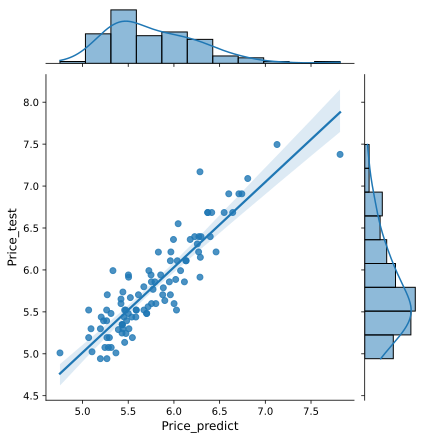

In [1123]:
y_pred = lasso_model.predict(x_te)
h=sns.jointplot(y_pred, y_test,kind='reg')
# h.fig.suptitle("Predict on Test Data",fontsize=16)
h.set_axis_labels('Price_predict', 'Price_test',fontsize=12)
plt.savefig('Lasso',bbox_inches="tight",dpi=300)

Computing regularization path using the LARS ...


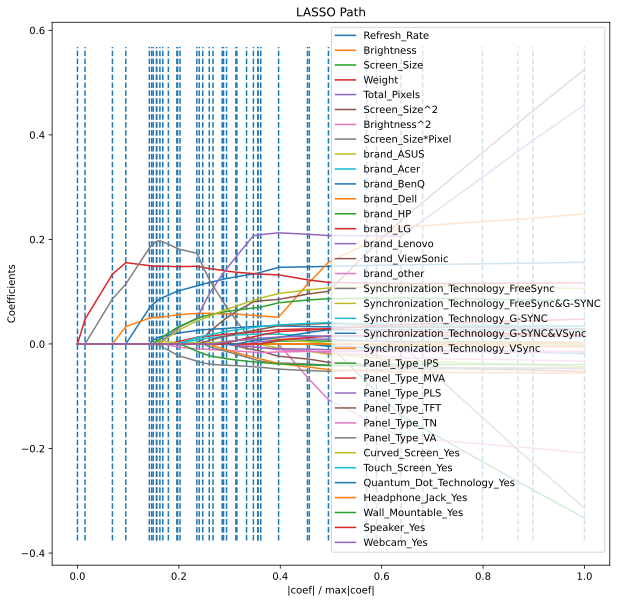

In [1124]:
from sklearn.linear_model import lars_path
import matplotlib.pyplot as plt

alphas = np.logspace(-4,4,200)
print("Computing regularization path using the LARS ...")
alphas, _, coefs = lars_path(x_tr, y_train.values, method='lasso')

# plotting the LARS path

xx = np.sum(np.abs(coefs.T), axis=1)
xx /= xx[-1]

plt.figure(figsize=(10,10))
plt.plot(xx, coefs.T)
ymin, ymax = plt.ylim()
plt.vlines(xx, ymin, ymax, linestyle='dashed')
plt.xlabel('|coef| / max|coef|')
plt.ylabel('Coefficients')
plt.title('LASSO Path')
plt.axis('tight')
plt.legend(x_train.columns)
plt.show()

### Fit an Elastic Net regression on y

In [1125]:
alphas = np.logspace(-4, 4, 200)

enet_model = ElasticNetCV(l1_ratio = [0.1, 0.5, 0.7, 0.9, 0.95, 0.99, 1], 
                          alphas = alphas, 
                          cv=5,
                          random_state=42)

enet_model.fit(x_tr, y_train)

r_squared_train = enet_model.score(x_tr, y_train)
r_squared_test = enet_model.score(x_te, y_test)
alpha = enet_model.alpha_
l1_ratio = enet_model.l1_ratio_

print("r_squared_train: ", round(r_squared_train, 3))
print("r_squared_test: ", round(r_squared_test, 3))
print(f"alpha: {alpha}")
print("l1_ratio: ", l1_ratio)

print(list(zip(x_train.columns, enet_model.coef_)))

r_squared_train:  0.809
r_squared_test:  0.808
alpha: 0.003370064329271928
l1_ratio:  0.5
[('Refresh_Rate', 0.14971392222348415), ('Brightness', 0.17703602966776796), ('Screen_Size', -0.05075774509694642), ('Weight', 0.11766065079418979), ('Total_Pixels', 0.20709406647221715), ('Screen_Size^2', 0.15033884153319232), ('Brightness^2', -0.12968544782607977), ('Screen_Size*Pixel', 0.0), ('brand_ASUS', -0.024012629506913005), ('brand_Acer', -0.007233639053612862), ('brand_BenQ', -0.006362765122404373), ('brand_Dell', -0.0), ('brand_HP', 0.005838052040413575), ('brand_LG', 0.02702970039782646), ('brand_Lenovo', 0.007064026476513876), ('brand_ViewSonic', -0.03881198134922849), ('brand_other', -0.020300892440898437), ('Synchronization_Technology_FreeSync', -0.05063665535090061), ('Synchronization_Technology_FreeSync&G-SYNC', 0.0010778191259886909), ('Synchronization_Technology_G-SYNC', 0.014602121421582978), ('Synchronization_Technology_G-SYNC&VSync', 0.0326821992499034), ('Synchronization_Tec

/Users/Layla/opt/anaconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


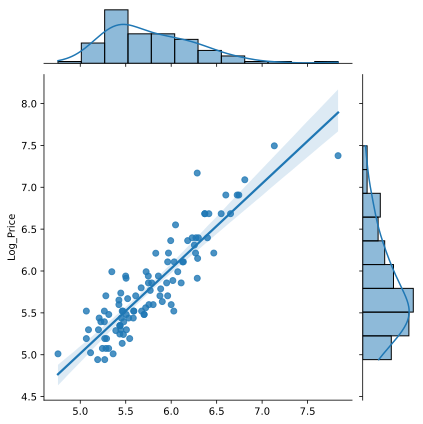

In [1103]:
y_pred = enet_model.predict(x_te)
sns.jointplot(y_pred, y_test, kind='reg')

### 6-11: Fit Random Forest Regression & Gradient Boosted Regression on y

In [1104]:
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.metrics import r2_score, mean_squared_error

print("Random Forest Regression:")
rf = RandomForestRegressor()
rf.fit(x_train, y_train)

y_train_pred=rf.predict(x_train)
y_test_pred = rf.predict(x_test)
print("r score on train data:", r2_score(y_train, y_train_pred))
print("r score on test data:", r2_score(y_test, y_test_pred))

Random Forest Regression:
r score on train data: 0.9618699743062811
r score on test data: 0.8449397464586988


In [1105]:
print("Gradient Boosted Regression:")
gbm = GradientBoostingRegressor()
gbm.fit(x_train, ylog_train)

y_train_pred=gbm.predict(x_train)
y_test_pred = gbm.predict(x_test)
print("r score on train data:", r2_score(y_train, y_train_pred))
print("r score on test data:", r2_score(y_test, y_test_pred))

Gradient Boosted Regression:
r score on train data: 0.932833410004556
r score on test data: 0.875700068975965


##### Both Random Forest Regression and Gradient Boosted Regression are overfit

In [1106]:
from sklearn.model_selection import KFold, cross_val_score
from sklearn.linear_model import Lasso
score_list=[]
alphas = np.logspace(-4,4,200)
for a in alphas:
    cv = KFold(n_splits=5,random_state=123,shuffle=True)  
    lasso = Lasso(alpha=a)  
    pipe = Pipeline([
        ('scale', StandardScaler()),
        ('clf', lasso)])
    scores = cross_val_score(pipe, x_train, y_train, cv=cv,n_jobs=-1)
    print(scores)
    score_list.append(scores)

/Users/Layla/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 0.13792358023541773, tolerance: 0.009253957758125186
  model = cd_fast.enet_coordinate_descent(
/Users/Layla/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 0.029048036315478143, tolerance: 0.008498089631616527
  model = cd_fast.enet_coordinate_descent(
/Users/Layla/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 0.02470184734552383, tolerance: 0.008498089631616527
  model = cd_fast.enet_coordinate_descent(


[0.78082649 0.68856662 0.7329464  0.77773613 0.79663647]


/Users/Layla/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 0.11584469265354436, tolerance: 0.009253957758125186
  model = cd_fast.enet_coordinate_descent(
/Users/Layla/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 0.09707559938686572, tolerance: 0.009253957758125186
  model = cd_fast.enet_coordinate_descent(
/Users/Layla/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 0.021045668420430985, tolerance: 0.008498089631616527
  model = cd_fast.enet_coordinate_descent(
/Users/Layla/opt/anaconda3/lib/python3.9/site-packages/sk

[0.78114852 0.68862379 0.73281521 0.77774136 0.79682908]
[0.78149578 0.68868562 0.73267076 0.77774613 0.7970384 ]
[0.78186952 0.68875209 0.73251204 0.77775035 0.79726566]


/Users/Layla/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 0.06776718281799354, tolerance: 0.009253957758125186
  model = cd_fast.enet_coordinate_descent(
/Users/Layla/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 0.05646824775289261, tolerance: 0.009253957758125186
  model = cd_fast.enet_coordinate_descent(
/Users/Layla/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 0.013273616068568472, tolerance: 0.008498089631616527
  model = cd_fast.enet_coordinate_descent(
/Users/Layla/opt/anaconda3/lib/python3.9/site-packages/sk

[0.78227072 0.68882348 0.7323372  0.77775367 0.79751211]
[0.78270034 0.68890007 0.73214455 0.77775185 0.79777905]
[0.78315904 0.68898189 0.73193266 0.77772386 0.79806778]
[0.78364709 0.68906899 0.73168358 0.7776911  0.79837955]
[0.78416407 0.68916148 0.73140148 0.77765248 0.79871558]
[0.78470919 0.68925925 0.73109013 0.777607   0.79907959]
[0.7852807  0.68936189 0.73074724 0.77755337 0.79947071]
[0.78587576 0.68946908 0.7303685  0.77748993 0.79988896]
[0.78649019 0.68958031 0.72995101 0.77743008 0.80033482]
[0.78711805 0.68969439 0.72948931 0.77738285 0.80080858]
[0.78775134 0.68981041 0.72897953 0.77732369 0.80130954]
[0.78838419 0.68992639 0.72841564 0.77725007 0.8018369 ]
[0.78900457 0.69004018 0.72779129 0.77715857 0.80238695]
[0.78959203 0.69014951 0.72709964 0.777038   0.8029456 ]


/Users/Layla/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 0.03249425024952757, tolerance: 0.009253957758125186
  model = cd_fast.enet_coordinate_descent(
/Users/Layla/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 0.008730177531219852, tolerance: 0.008498089631616527
  model = cd_fast.enet_coordinate_descent(
/Users/Layla/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 0.026983574284997758, tolerance: 0.009253957758125186
  model = cd_fast.enet_coordinate_descent(
/Users/Layla/opt/anaconda3/lib/python3.9/site-packages/s

[0.79011458 0.69025204 0.72633332 0.77688402 0.8035217 ]
[0.79054111 0.69035754 0.72548224 0.77669546 0.80411003]
[0.79083323 0.69080502 0.72453769 0.77646555 0.80470579]
[0.79094198 0.69170607 0.72348816 0.7761847  0.80525626]
[0.79079364 0.69267047 0.72237556 0.7758429  0.80577567]
[0.79121419 0.69369649 0.72178258 0.77542663 0.80625335]
[0.79164434 0.69478671 0.72126061 0.77487405 0.80666673]
[0.79207851 0.6959371  0.72068057 0.77413542 0.80698702]
[0.7925095  0.69714682 0.72003269 0.7732925  0.80720162]
[0.79297854 0.69841067 0.71931014 0.77241318 0.807439  ]
[0.79360112 0.69971955 0.71850258 0.77141864 0.8075003 ]
[0.79420263 0.70106444 0.71762383 0.77029519 0.80692812]
[0.79476509 0.70242812 0.71665709 0.76901879 0.80574899]
[0.79526441 0.70383435 0.71556848 0.76757229 0.80513403]
[0.7956679  0.70523436 0.71445811 0.76592555 0.80473703]
[0.79582461 0.70655141 0.71339279 0.7641161  0.80426143]
[0.79495027 0.7075908  0.71305766 0.76217965 0.8036762 ]
[0.79284583 0.70790124 0.712662

[-0.03437247 -0.01683032 -0.02625472 -0.00213116 -0.01902743]
[-0.03437247 -0.01683032 -0.02625472 -0.00213116 -0.01902743]
[-0.03437247 -0.01683032 -0.02625472 -0.00213116 -0.01902743]
[-0.03437247 -0.01683032 -0.02625472 -0.00213116 -0.01902743]
[-0.03437247 -0.01683032 -0.02625472 -0.00213116 -0.01902743]
[-0.03437247 -0.01683032 -0.02625472 -0.00213116 -0.01902743]
[-0.03437247 -0.01683032 -0.02625472 -0.00213116 -0.01902743]
[-0.03437247 -0.01683032 -0.02625472 -0.00213116 -0.01902743]
[-0.03437247 -0.01683032 -0.02625472 -0.00213116 -0.01902743]
[-0.03437247 -0.01683032 -0.02625472 -0.00213116 -0.01902743]
[-0.03437247 -0.01683032 -0.02625472 -0.00213116 -0.01902743]
[-0.03437247 -0.01683032 -0.02625472 -0.00213116 -0.01902743]
[-0.03437247 -0.01683032 -0.02625472 -0.00213116 -0.01902743]
[-0.03437247 -0.01683032 -0.02625472 -0.00213116 -0.01902743]
[-0.03437247 -0.01683032 -0.02625472 -0.00213116 -0.01902743]
[-0.03437247 -0.01683032 -0.02625472 -0.00213116 -0.01902743]
[-0.0343

In [1107]:
score_list[0]

array([0.78082649, 0.68856662, 0.7329464 , 0.77773613, 0.79663647])

In [ ]:
#alpha still unsolved, will look into it later